In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

In [3]:
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import MinMaxScaler,StandardScaler, RobustScaler, MaxAbsScaler, LabelEncoder, OneHotEncoder, PowerTransformer
from sklearn.metrics import mean_squared_error,accuracy_score,recall_score,precision_score,f1_score,roc_auc_score
from sklearn.model_selection import train_test_split, RepeatedKFold, KFold, cross_val_score, GridSearchCV, RandomizedSearchCV, RepeatedStratifiedKFold
from sklearn.metrics import make_scorer, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score

In [3]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 7.9 MB/s eta 0:00:00


In [4]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier


/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [5]:
data = pd.read_csv('/content/trained_data.xls')

In [6]:
data.head()

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,17,49,2,0,458.0,0.0,229.0,229.0,229.0,0.0,...,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NetBIOS
1,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,1480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP
2,17,1,2,0,458.0,0.0,229.0,229.0,229.0,0.0,...,14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NetBIOS
3,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP
4,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP


In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125170 entries, 0 to 125169
Data columns (total 78 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Protocol                  125170 non-null  int64  
 1   Flow Duration             125170 non-null  int64  
 2   Total Fwd Packets         125170 non-null  int64  
 3   Total Backward Packets    125170 non-null  int64  
 4   Fwd Packets Length Total  125170 non-null  float64
 5   Bwd Packets Length Total  125170 non-null  float64
 6   Fwd Packet Length Max     125170 non-null  float64
 7   Fwd Packet Length Min     125170 non-null  float64
 8   Fwd Packet Length Mean    125170 non-null  float64
 9   Fwd Packet Length Std     125170 non-null  float64
 10  Bwd Packet Length Max     125170 non-null  float64
 11  Bwd Packet Length Min     125170 non-null  float64
 12  Bwd Packet Length Mean    125170 non-null  float64
 13  Bwd Packet Length Std     125170 non-null  f

In [ ]:
data.isnull().sum()

,0
Protocol,0
Flow Duration,0
Total Fwd Packets,0
Total Backward Packets,0
Fwd Packets Length Total,0
...,...
Idle Mean,0
Idle Std,0
Idle Max,0
Idle Min,0


In [ ]:
print(data.columns)

Index(['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Bwd Packets Length Total', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Packet Length Min', 'Packet Length Max', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Count', 'RST Fla

In [7]:
def extract_column_types(df, category_threshold=10, cardinality_threshold=20):


    categorical_columns = [col for col in df.columns if df[col].dtype == "object"]
    numeric_as_category = [col for col in df.columns if df[col].nunique() < category_threshold and df[col].dtype != "object"]
    high_cardinality_categorical = [col for col in df.columns if df[col].nunique() > cardinality_threshold and df[col].dtype == "object"]


    categorical_columns += numeric_as_category
    categorical_columns = [col for col in categorical_columns if col not in high_cardinality_categorical]


    numerical_columns = [col for col in df.columns if df[col].dtype != "object"]
    numerical_columns = [col for col in numerical_columns if col not in numeric_as_category]


    print(f"Total Observations: {df.shape[0]}")
    print(f"Total Features: {df.shape[1]}")
    print(f'Categorical Columns: {len(categorical_columns)}')
    print(f'Numerical Columns: {len(numerical_columns)}')
    print(f'High Cardinality Categorical Columns: {len(high_cardinality_categorical)}')

    return categorical_columns, numerical_columns, high_cardinality_categorical


cat_cols, num_cols, high_car_cat = extract_column_types(data)
cat_cols, num_cols, high_car_cat


Total Observations: 125170
Total Features: 78
Categorical Columns: 20
Numerical Columns: 58
High Cardinality Categorical Columns: 0


(['Label',
  'Protocol',
  'Fwd PSH Flags',
  'Bwd PSH Flags',
  'Fwd URG Flags',
  'Bwd URG Flags',
  'FIN Flag Count',
  'SYN Flag Count',
  'RST Flag Count',
  'PSH Flag Count',
  'ACK Flag Count',
  'URG Flag Count',
  'CWE Flag Count',
  'ECE Flag Count',
  'Fwd Avg Bytes/Bulk',
  'Fwd Avg Packets/Bulk',
  'Fwd Avg Bulk Rate',
  'Bwd Avg Bytes/Bulk',
  'Bwd Avg Packets/Bulk',
  'Bwd Avg Bulk Rate'],
 ['Flow Duration',
  'Total Fwd Packets',
  'Total Backward Packets',
  'Fwd Packets Length Total',
  'Bwd Packets Length Total',
  'Fwd Packet Length Max',
  'Fwd Packet Length Min',
  'Fwd Packet Length Mean',
  'Fwd Packet Length Std',
  'Bwd Packet Length Max',
  'Bwd Packet Length Min',
  'Bwd Packet Length Mean',
  'Bwd Packet Length Std',
  'Flow Bytes/s',
  'Flow Packets/s',
  'Flow IAT Mean',
  'Flow IAT Std',
  'Flow IAT Max',
  'Flow IAT Min',
  'Fwd IAT Total',
  'Fwd IAT Mean',
  'Fwd IAT Std',
  'Fwd IAT Max',
  'Fwd IAT Min',
  'Bwd IAT Total',
  'Bwd IAT Mean',
  'Bwd I

         Count  Percentage
Label                     
Syn      48840   39.018934
Benign   46427   37.091156
UDP      18090   14.452345
MSSQL     8523    6.809140
LDAP      1906    1.522729
Portmap    685    0.547256
NetBIOS    644    0.514500
UDPLag      55    0.043940


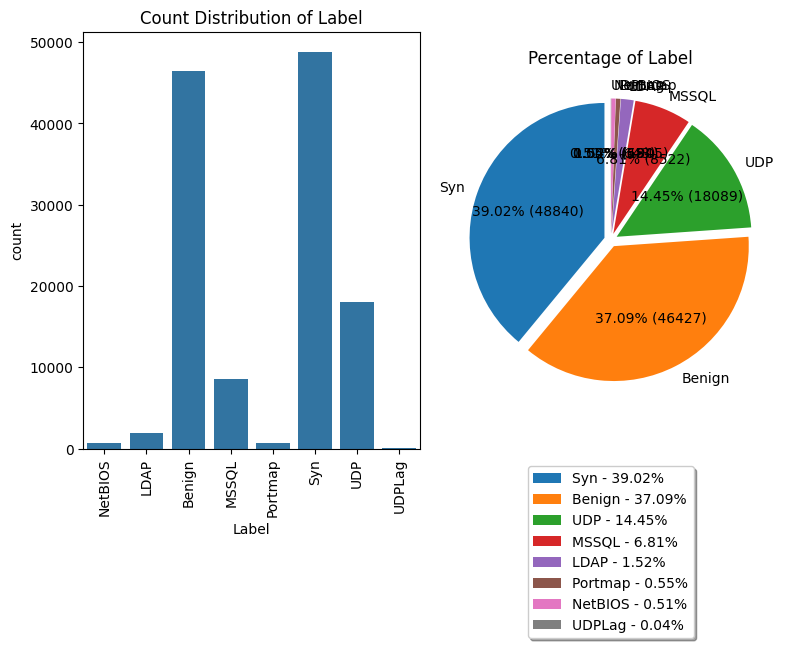

          Count  Percentage
Protocol                   
6         79530   63.537589
17        44814   35.802509
0           826    0.659903


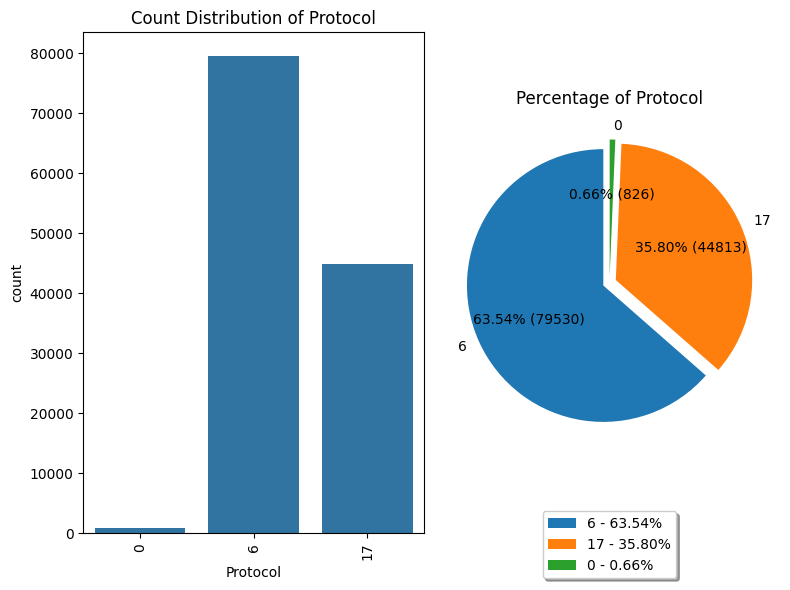

                Count  Percentage
Fwd PSH Flags                    
0              118967    95.04434
1                6203     4.95566


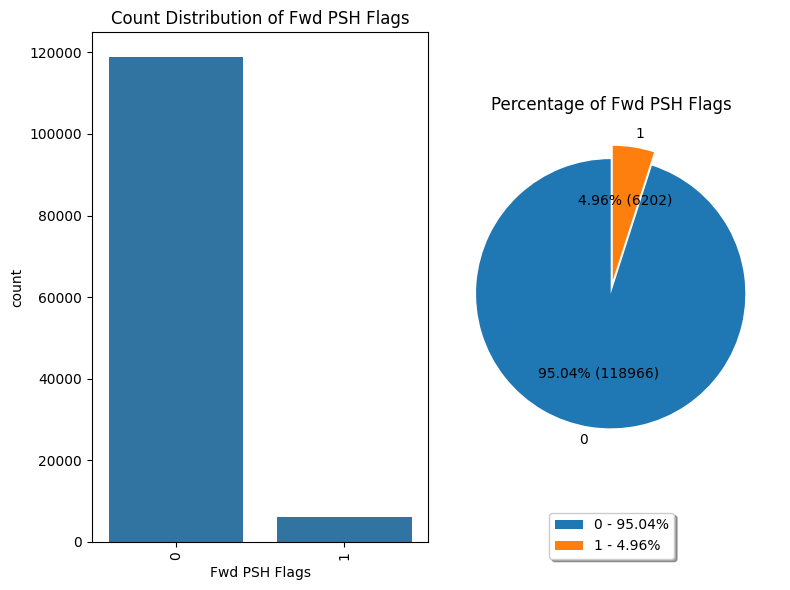

                Count  Percentage
Bwd PSH Flags                    
0              125170       100.0


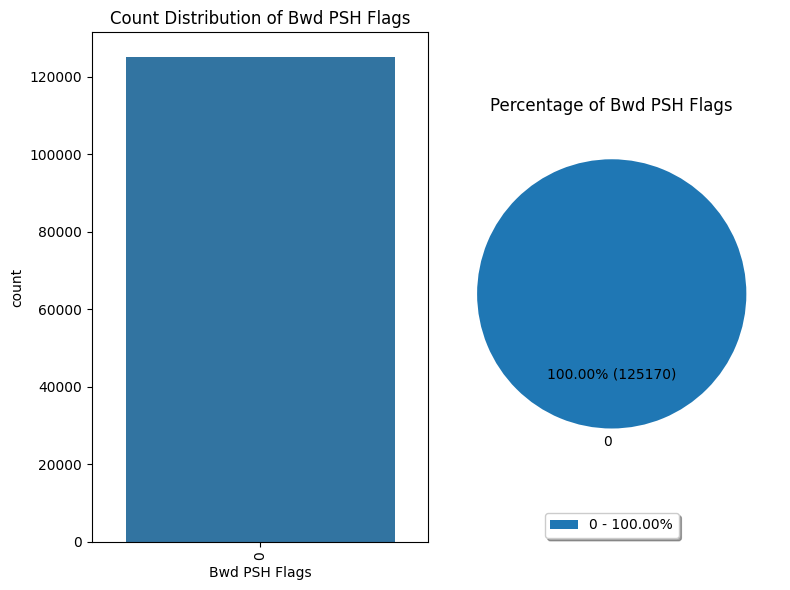

                Count  Percentage
Fwd URG Flags                    
0              125170       100.0


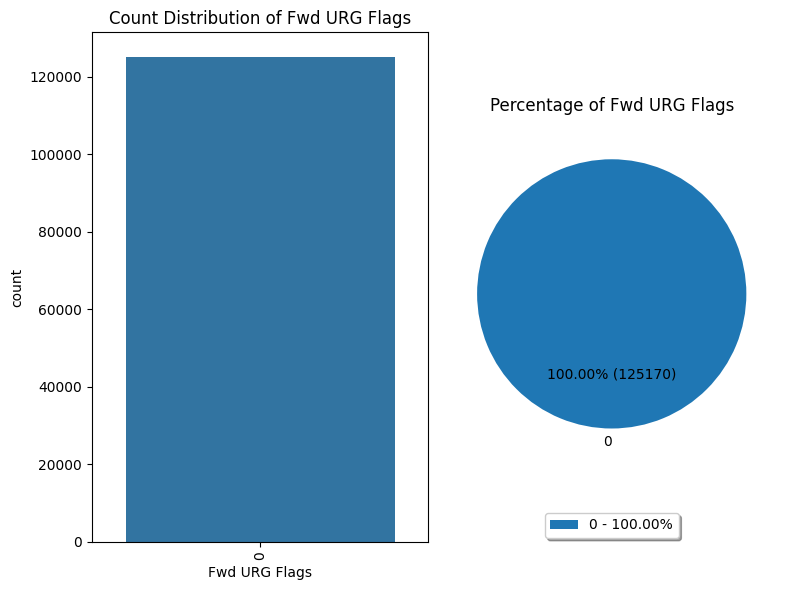

                Count  Percentage
Bwd URG Flags                    
0              125170       100.0


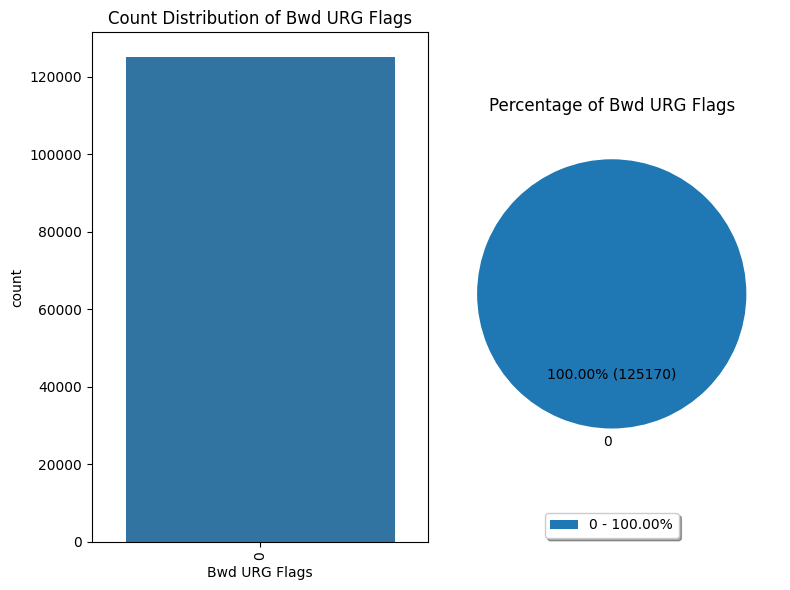

                 Count  Percentage
FIN Flag Count                    
0               125170       100.0


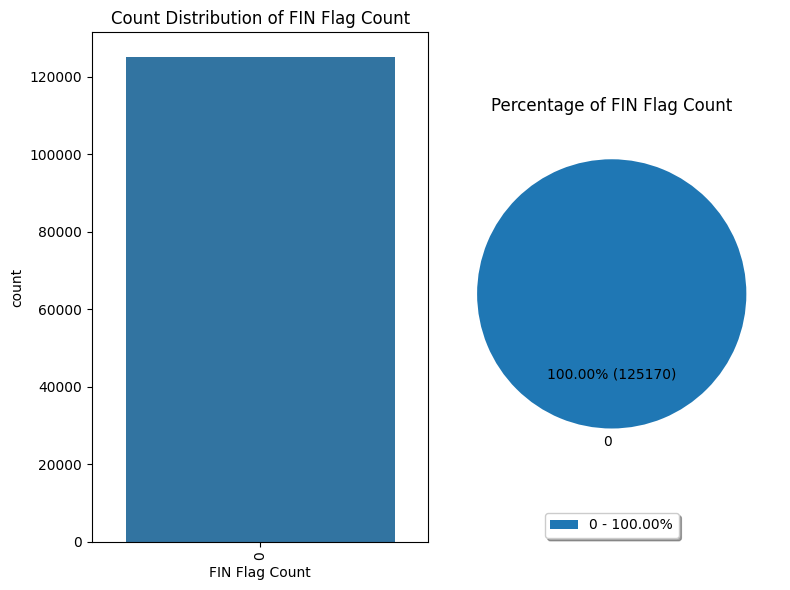

                 Count  Percentage
SYN Flag Count                    
0               125042   99.897739
1                  128    0.102261


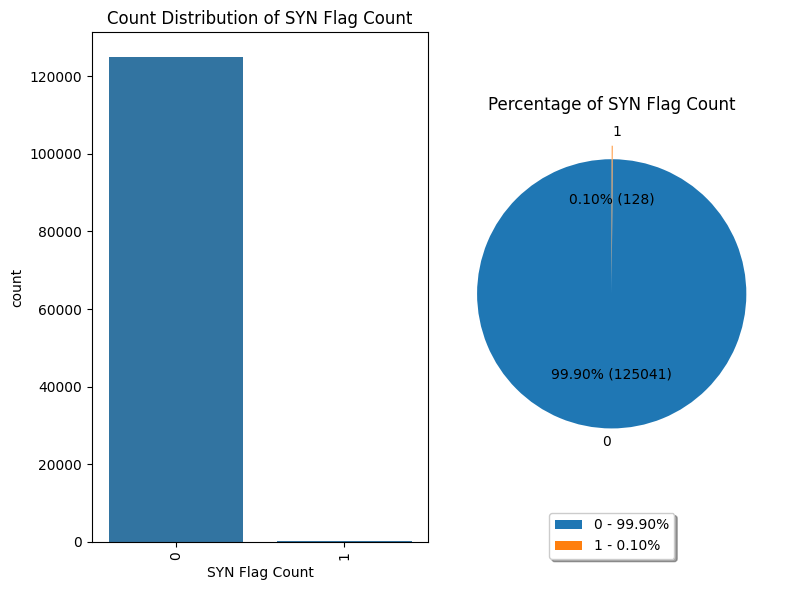

                 Count  Percentage
RST Flag Count                    
0               118967    95.04434
1                 6203     4.95566


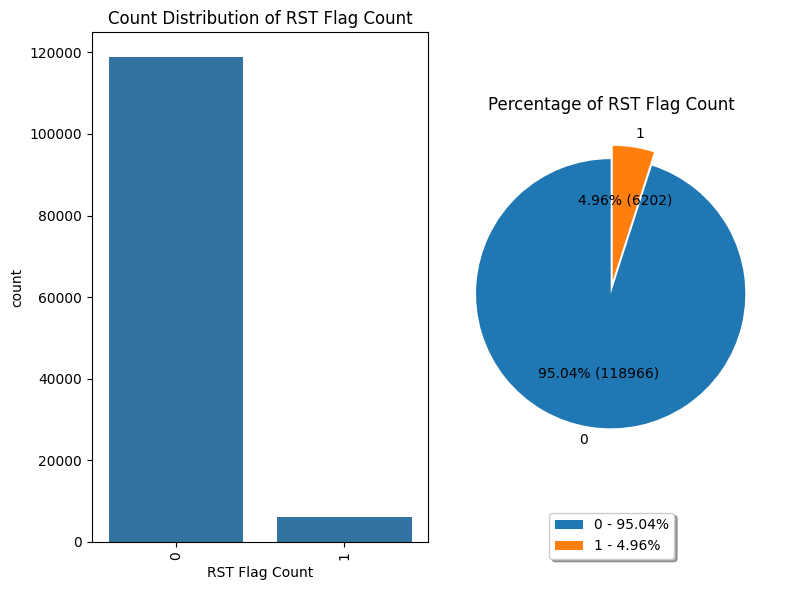

                 Count  Percentage
PSH Flag Count                    
0               125170       100.0


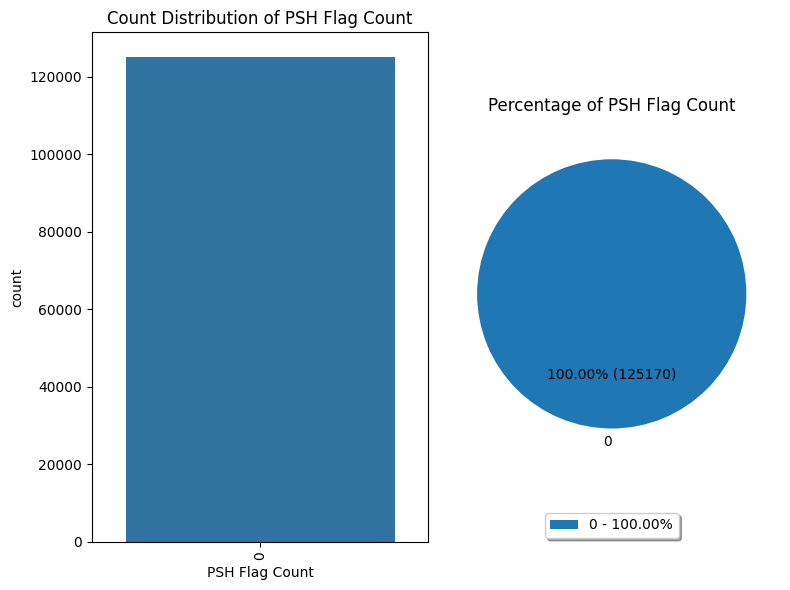

                Count  Percentage
ACK Flag Count                   
0               66222   52.905648
1               58948   47.094352


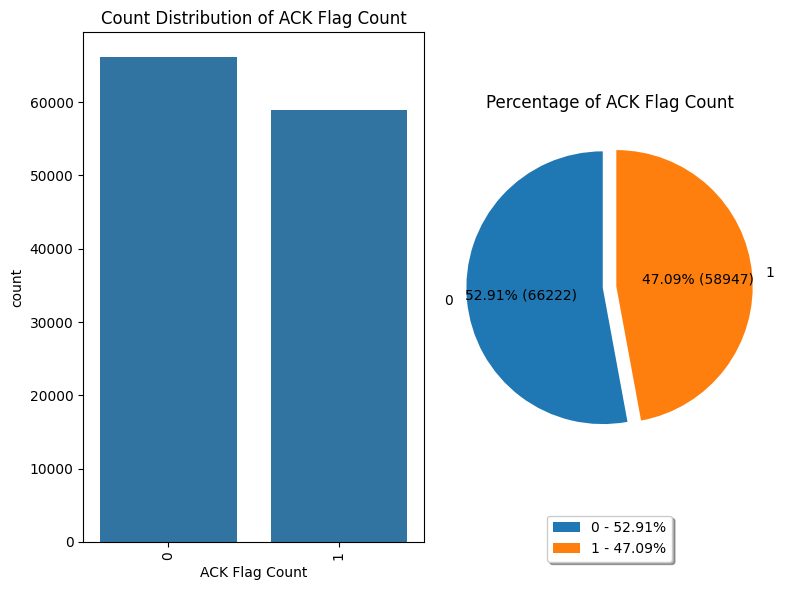

                 Count  Percentage
URG Flag Count                    
0               104592   83.559958
1                20578   16.440042


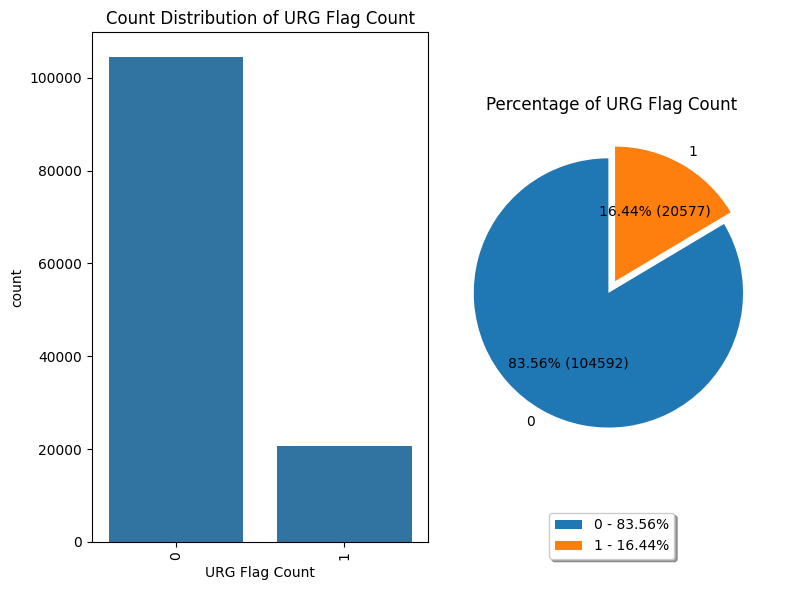

                 Count  Percentage
CWE Flag Count                    
0               114878   91.777582
1                10292    8.222418


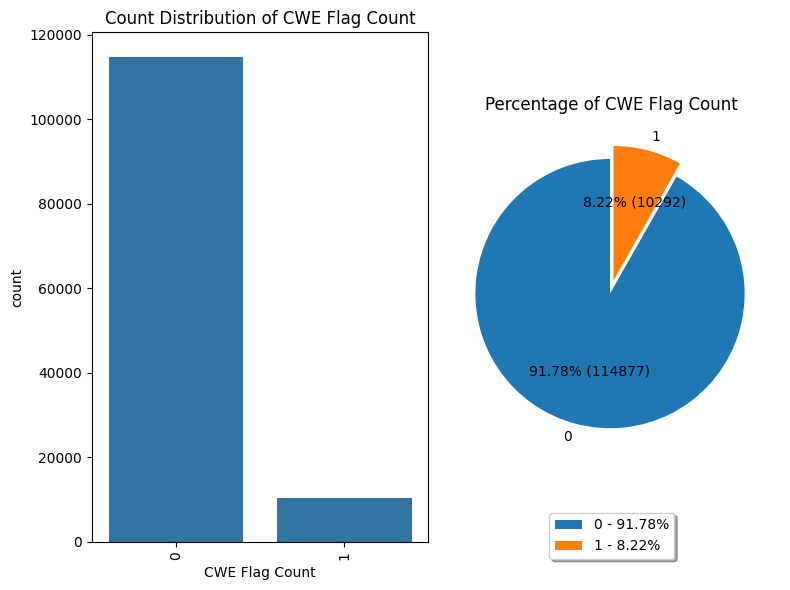

                 Count  Percentage
ECE Flag Count                    
0               125170       100.0


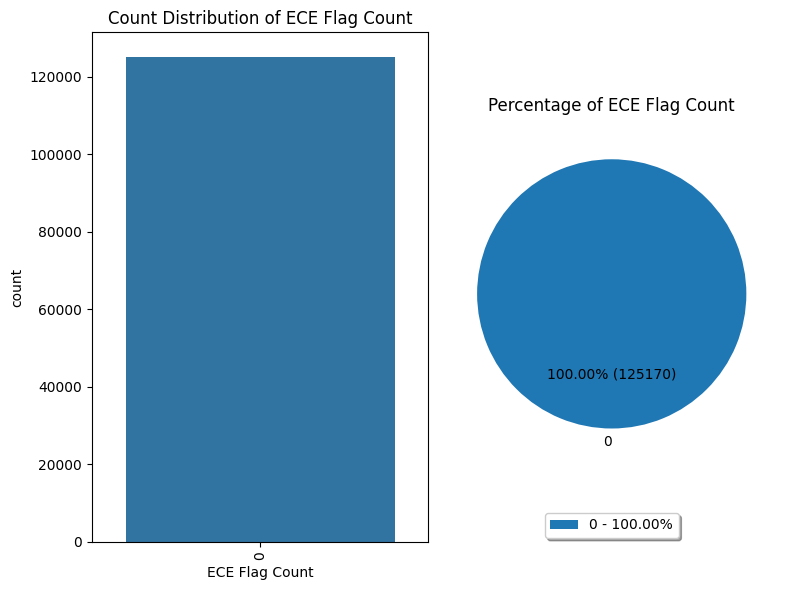

                     Count  Percentage
Fwd Avg Bytes/Bulk                    
0                   125170       100.0


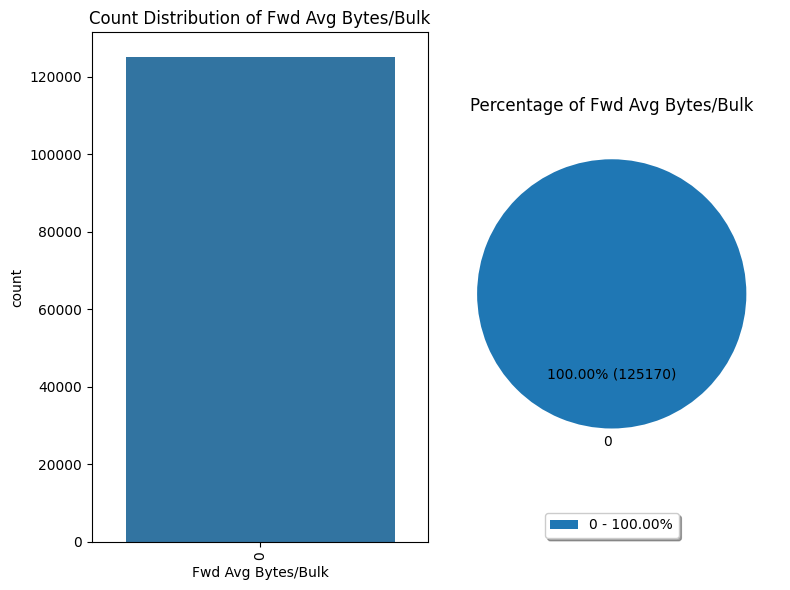

                       Count  Percentage
Fwd Avg Packets/Bulk                    
0                     125170       100.0


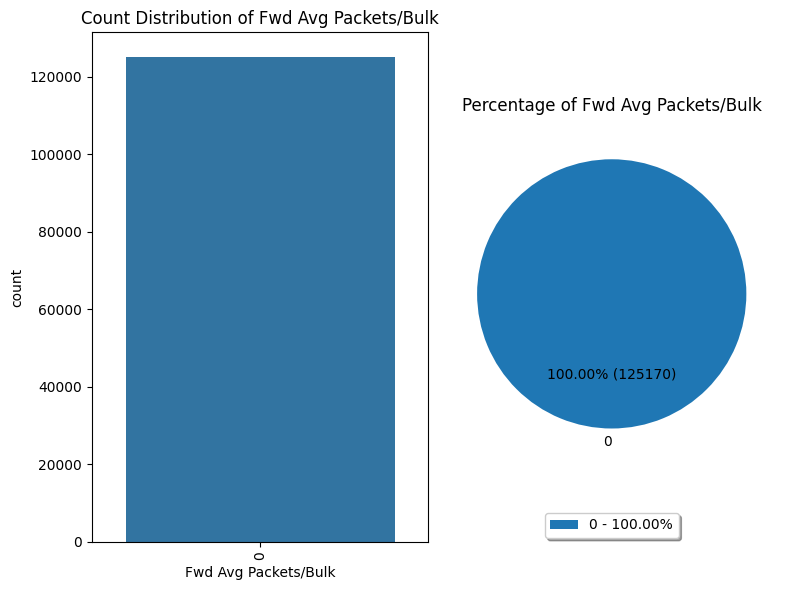

                    Count  Percentage
Fwd Avg Bulk Rate                    
0                  125170       100.0


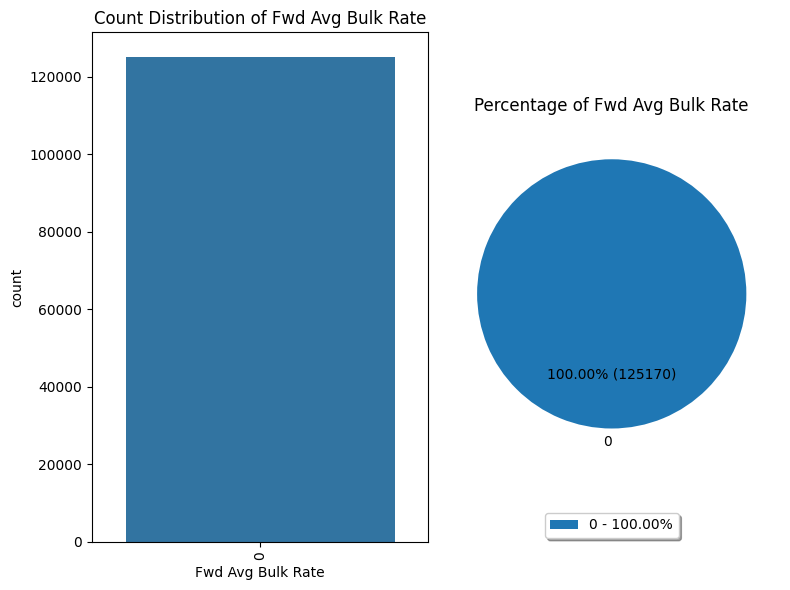

                     Count  Percentage
Bwd Avg Bytes/Bulk                    
0                   125170       100.0


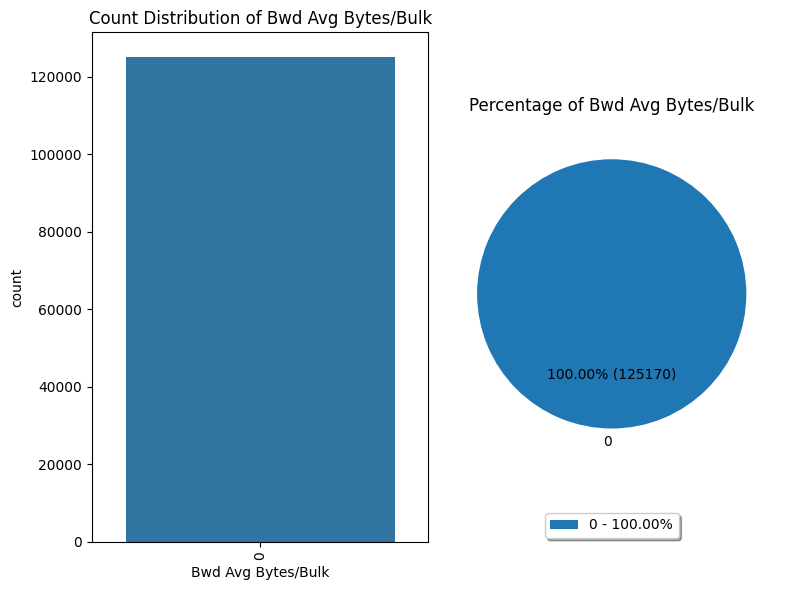

                       Count  Percentage
Bwd Avg Packets/Bulk                    
0                     125170       100.0


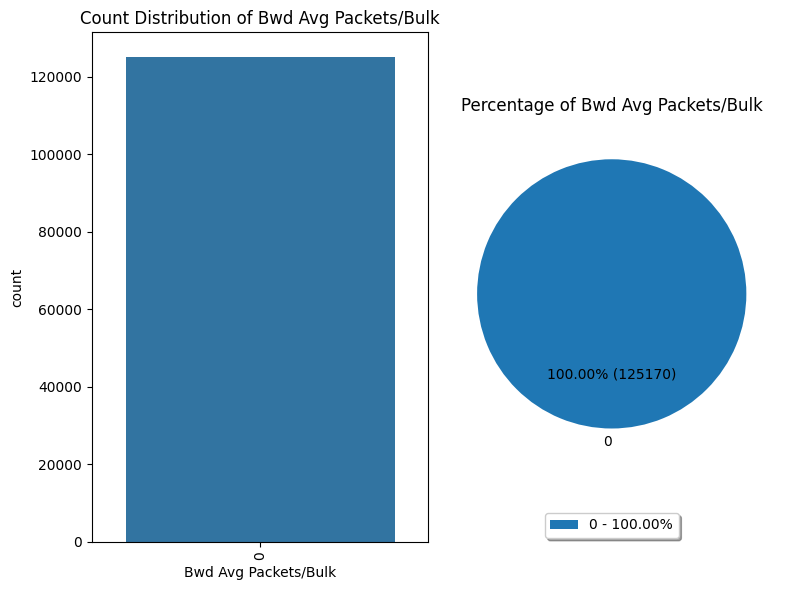

                    Count  Percentage
Bwd Avg Bulk Rate                    
0                  125170       100.0


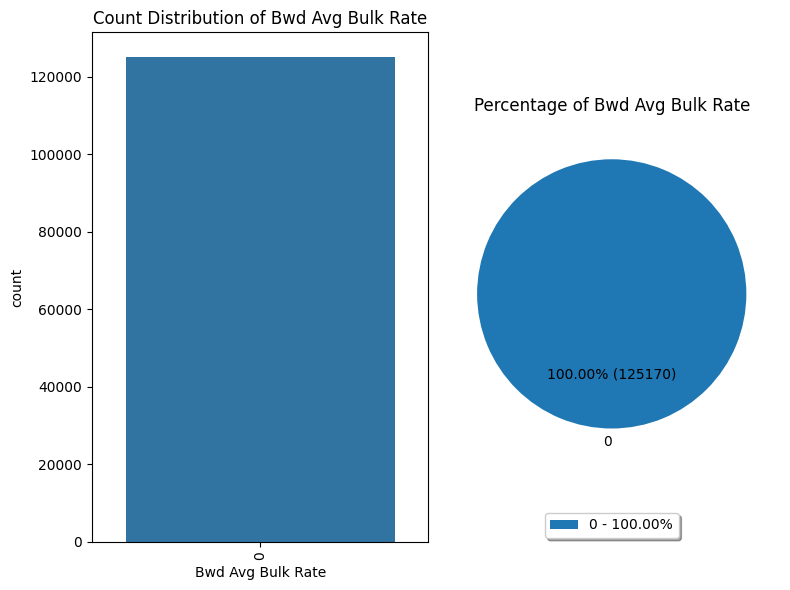

In [ ]:
def summarize_categorical(df, column, show_plot=False):

    summary_df = pd.DataFrame({
        'Count': df[column].value_counts(),
        'Percentage': 100 * df[column].value_counts() / len(df)
    })
    print(summary_df)


    if show_plot:
        fig, axes = plt.subplots(1, 2, figsize=(8, 6))


        sns.countplot(x=column, data=df, ax=axes[0])
        axes[0].set_title(f"Count Distribution of {column}")
        axes[0].tick_params(axis='x', rotation=90)


        values = df[column].value_counts()

        explode = [0.05] * len(values)


        axes[1].pie(x=values, labels=values.index, explode=explode,
                    autopct=lambda p: f'{p:.2f}% ({int(p/100*sum(values))})',
                    startangle=90, labeldistance=1.1)

        axes[1].set_title(f"Percentage of {column}")


        plt.legend(
            labels=[f'{label} - {percentage:.2f}%' for label, percentage in zip(values.index, values/len(df)*100)],
            loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=1, shadow=True)

        plt.tight_layout()
        plt.show()

for category in cat_cols:
    summarize_categorical(data, category, show_plot=True)


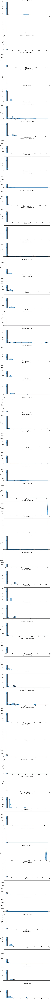

In [ ]:
def plot_histogram(df, col, ax):
    sns.histplot(df[col], kde=True, ax=ax, bins=30)
    ax.set_title(f'Histogram of {col}')


def plot_distribution(df, col, ax):
    sns.histplot(df[col], ax=ax, kde=True, bins=30)
    ax.set_title(f'Distribution of {col}')

# Kernel Density Estimate Plot
def plot_kde(df, col, ax):
    sns.kdeplot(df[col], ax=ax, fill=True)
    ax.set_title(f'KDE of {col}')

# Scatter Plot
def plot_scatter(df, col, ax):
    sns.scatterplot(x=df.index, y=df[col], ax=ax)
    ax.set_title(f'Scatter Plot of {col}')

# Line Plot
def plot_line(df, col, ax):
    sns.lineplot(x=df.index, y=df[col], ax=ax)
    ax.set_title(f'Line Plot of {col}')

# Pie Chart
def plot_pie_chart(df, col, ax):
    labels = df[col].value_counts()
    ax.pie(labels, labels=labels.index, autopct='%1.1f%%')
    ax.set_title(f'Pie Chart of {col}')

# Count Plot
def plot_count(df, col, ax):
    sns.countplot(x=df[col], ax=ax)
    ax.set_title(f'Count Plot of {col}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

# Box Plot
def plot_box(df, col, ax):
    sns.boxplot(y=df[col], ax=ax)
    ax.set_title(f'Box Plot of {col}')

# Violin Plot
def plot_violin(df, col, ax):
    sns.violinplot(y=df[col], ax=ax)
    ax.set_title(f'Violin Plot of {col}')

# Heatmap for Correlation
def plot_heatmap(df, size=(10, 8)):
    plt.figure(figsize=size)
    sns.heatmap(df.corr(), annot=True, fmt=".1f", cmap='Blues', annot_kws={"size": 12})
    plt.title('Correlation Heatmap')
    plt.show()

# Variable vs Label Plot
def plot_vs(df, normal_col, label_col):
    plt.figure(figsize=(10, 6), dpi=80)
    plt.bar(df[normal_col].value_counts().index, df[normal_col].value_counts().values, color='r', label='All')
    plt.bar(df[df[label_col] == 1][normal_col].value_counts().index,
            df[df[label_col] == 1][normal_col].value_counts().values, color='b', label=label_col)
    plt.xlabel(normal_col)
    plt.ylabel('Count')
    plt.legend()

# Function to plot multiple charts for a single feature
def plot_single_feature_grid(df, plot_func, size=(12, 4), n_col=1):
    if len(df.columns) == 0:
        return
    n_rows = (len(df.columns) + n_col - 1) // n_col
    fig, axes = plt.subplots(n_rows, n_col, figsize=(size[0] * n_col, size[1] * n_rows))

    if len(df.columns) == 1:
        axes = np.array([axes])
    axes = axes.flatten()

    for i, label in enumerate(df.columns):
        plot_func(df, label, axes[i])
        axes[i].set_xlabel(label)

    for j in range(i + 1, n_rows * n_col):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Example usage
plot_single_feature_grid(data[num_cols], plot_distribution)

<ipython-input-19-939beeaa7db1>:35: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)


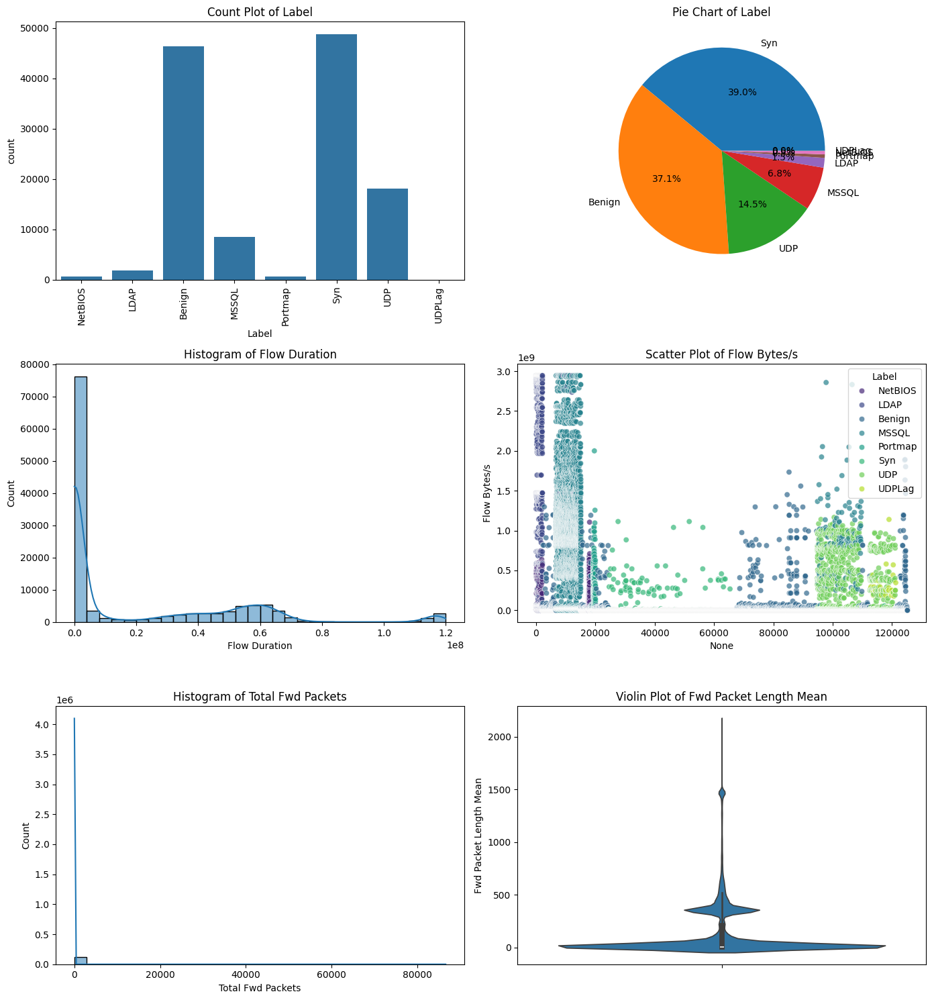

In [ ]:
# Create the plots using your predefined functions
fig, axes = plt.subplots(3, 2, figsize=(14, 15))

plot_count(data, 'Label', axes[0, 0])

plot_pie_chart(data, 'Label', axes[0, 1])


plot_histogram(data, 'Flow Duration', axes[1, 0])

def plot__scatter(df, col, ax):
    sns.scatterplot(x=df.index, y=df[col], hue=df['Label'], ax=ax, palette='viridis', alpha=0.7)
    ax.set_title(f'Scatter Plot of {col}')
    ax.legend(title='Label', loc='upper right')

plot__scatter(data, 'Flow Bytes/s', axes[1, 1])


plot_histogram(data, 'Total Fwd Packets', axes[2, 0])

plot_violin(data, 'Fwd Packet Length Mean', axes[2, 1])
plt.tight_layout()
plt.show()


<ipython-input-22-31465a0608c0>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Label', y='Flow Duration', data=data, palette='pastel', fliersize=5)


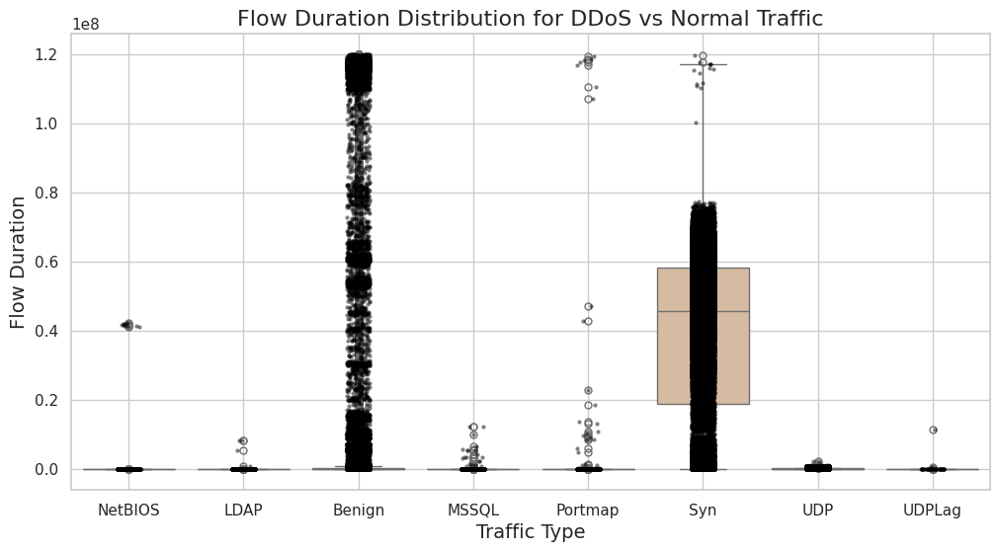

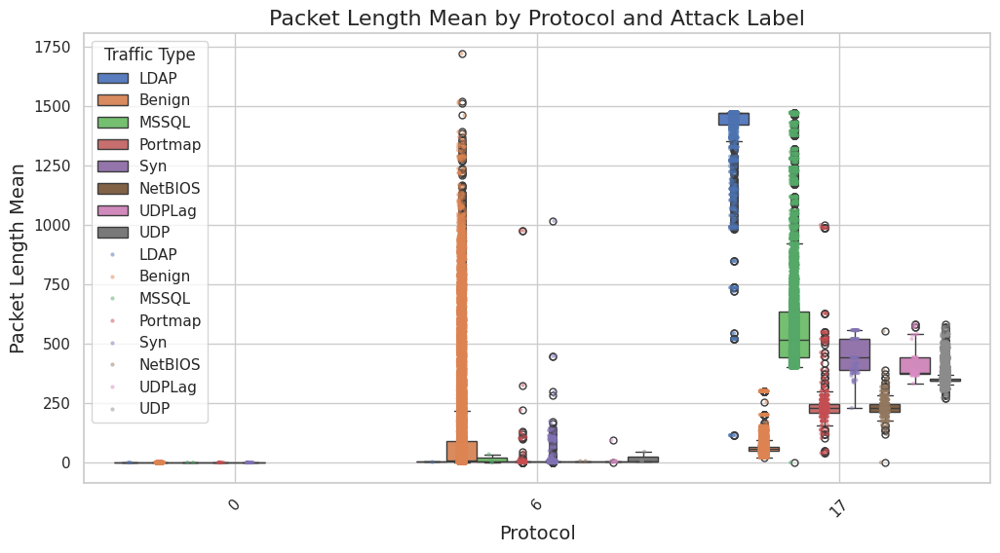

In [ ]:
sns.set(style='whitegrid')


plt.figure(figsize=(12, 6))
sns.boxplot(x='Label', y='Flow Duration', data=data, palette='pastel', fliersize=5)
sns.stripplot(x='Label', y='Flow Duration', data=data, color='black', alpha=0.5, size=3, jitter=True)
plt.title('Flow Duration Distribution for DDoS vs Normal Traffic', fontsize=16)
plt.xlabel('Traffic Type', fontsize=14)
plt.ylabel('Flow Duration', fontsize=14)
plt.xticks(rotation=0)
plt.grid(True)
plt.show()


#Box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Protocol', y='Packet Length Mean', hue='Label', data=data, palette='muted', fliersize=5)
sns.stripplot(x='Protocol', y='Packet Length Mean', hue='Label', data=data, dodge=True, alpha=0.5, size=3, jitter=True, marker='o')
plt.title('Packet Length Mean by Protocol and Attack Label', fontsize=16)
plt.xlabel('Protocol', fontsize=14)
plt.ylabel('Packet Length Mean', fontsize=14)
plt.xticks(rotation=45)
plt.legend(title='Traffic Type')
plt.grid(True)
plt.show()

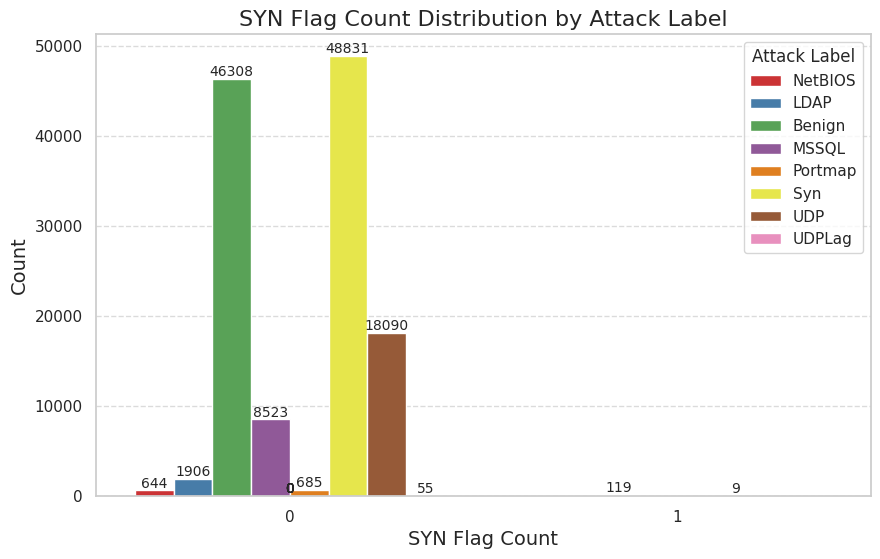

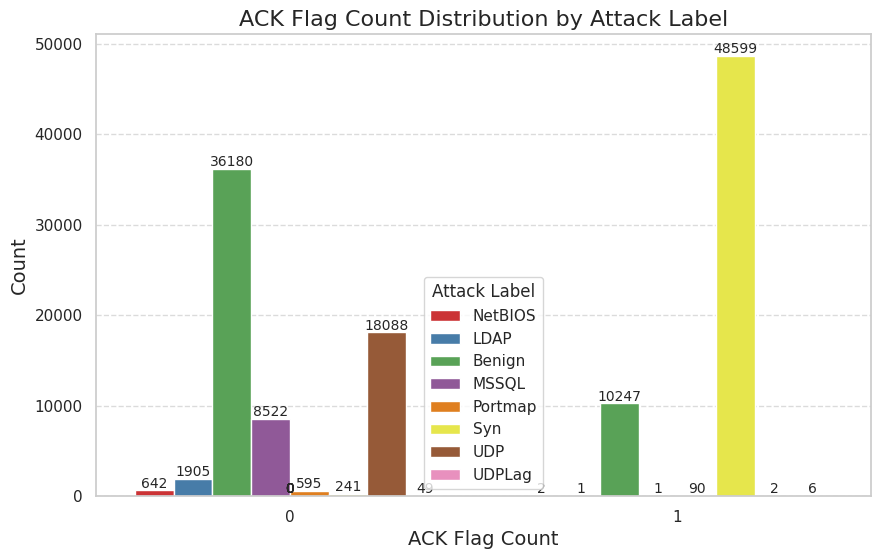

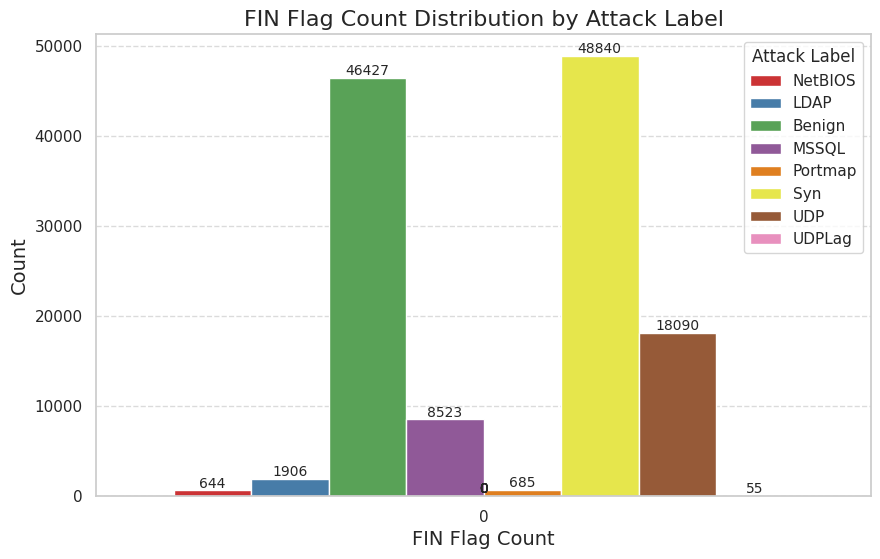

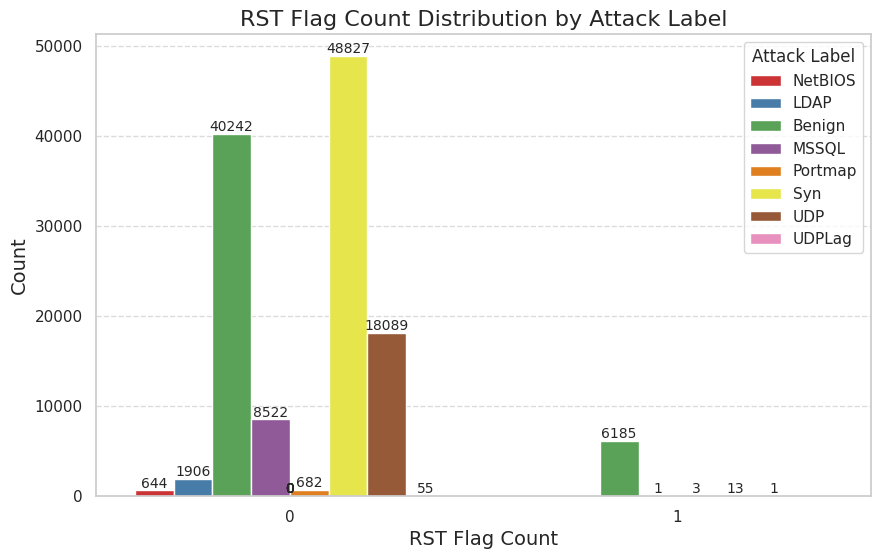

In [ ]:
# Enhanced Count Plots for Flag Columns
flag_columns = ['SYN Flag Count', 'ACK Flag Count', 'FIN Flag Count', 'RST Flag Count']

for flag in flag_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(x=flag, hue='Label', data=data, palette='Set1')  # Use distinct colors
    plt.title(f'{flag} Distribution by Attack Label', fontsize=16)
    plt.xlabel(flag, fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=0)


    for p in plt.gca().patches:
        plt.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='bottom', fontsize=10)

    plt.legend(title='Attack Label')
    plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add a grid for better readability
    plt.show()


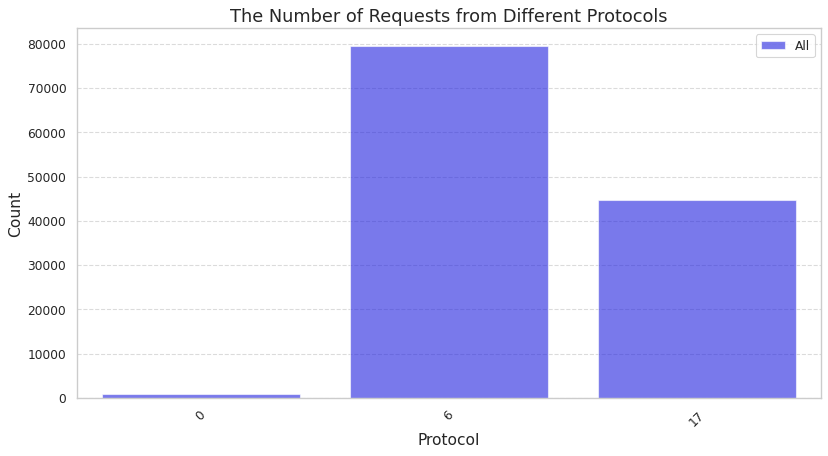

In [ ]:
# Enhanced Bar Plot for Protocols
plt.figure(figsize=(12, 6), dpi=80)
protocol_counts = data.Protocol.value_counts()
malicious_protocol_counts = data[data.Label == 1].Protocol.value_counts()

# Bar plot for all protocols
sns.barplot(x=protocol_counts.index, y=protocol_counts.values, color='blue', alpha=0.6, label='All')
# Bar plot for malicious protocols
sns.barplot(x=malicious_protocol_counts.index, y=malicious_protocol_counts.values, color='red', alpha=0.8, label='Malicious')

plt.xlabel('Protocol', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('The Number of Requests from Different Protocols', fontsize=16)
plt.legend()
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


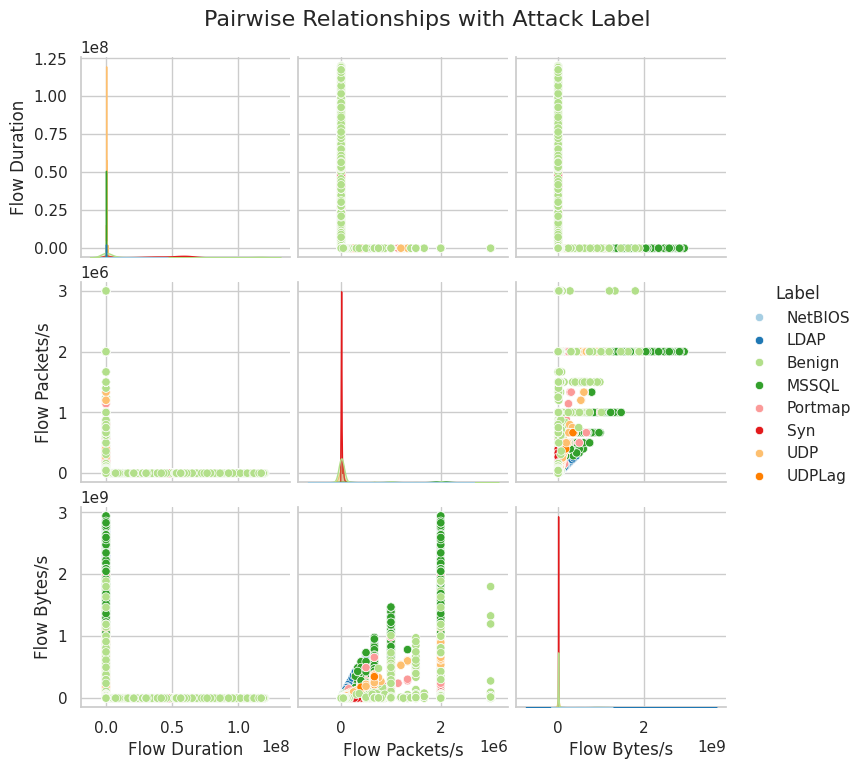

In [ ]:
# Pair Plot with 'Paired' Palette
sns.pairplot(data[['Flow Duration', 'Flow Packets/s', 'Flow Bytes/s', 'Label']],
             hue='Label', palette='Paired', diag_kind='kde')
plt.suptitle('Pairwise Relationships with Attack Label', y=1.02, fontsize=16)
plt.show()


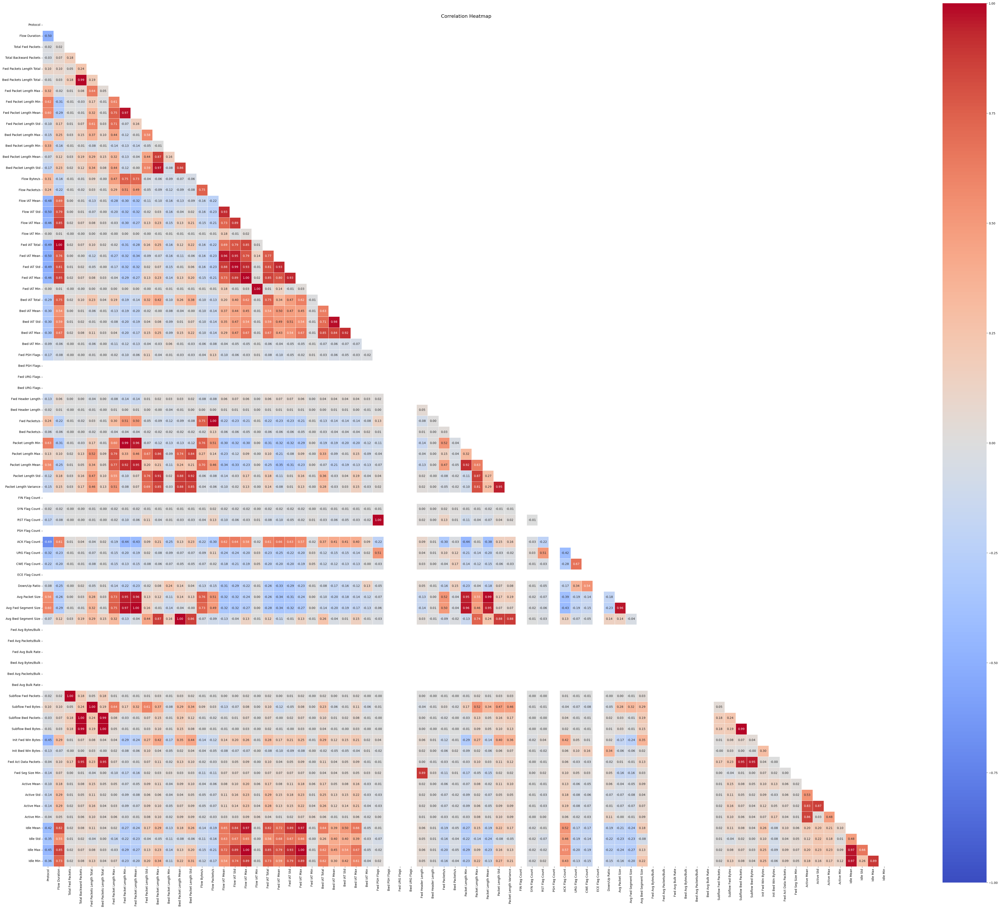

In [ ]:
def my_enhanced_heatmap(df, size=(10, 8)):
    plt.figure(figsize=size)


    corr = df.corr()

    # Create a heatmap with annotations
    mask = np.triu(np.ones_like(corr, dtype=bool))  # Mask for the upper triangle
    sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm',
                mask=mask, square=True, linewidths=0.5,
                cbar_kws={"shrink": .8},
                annot_kws={"size": 10},
                vmin=-1, vmax=1)

    plt.title('Correlation Heatmap', fontsize=16)
    plt.tight_layout()
    plt.show()

# Usage
n_numeric_cols = len(data.select_dtypes(include=[np.number]).columns) // 3 * 2
my_enhanced_heatmap(data.select_dtypes(include=[np.number]), size=(n_numeric_cols + 1, n_numeric_cols + 1))

In [ ]:
n_numeric_cols

50

In [8]:
correlation_matrix = data.select_dtypes(include=[np.number]).corr()

# Define the threshold for high correlation
threshold = 0.8


highly_correlated_pairs = []

print("Highly Correlated Columns:")
for col in correlation_matrix.columns:
    for row in correlation_matrix.index:
        # Check if the two columns are different and the correlation is above the threshold
        if col != row and abs(correlation_matrix.loc[row, col]) > threshold:
            pair = (row, col)
            if pair not in highly_correlated_pairs and (col, row) not in highly_correlated_pairs:
                highly_correlated_pairs.append(pair)
                print(f"{row} and {col} have correlation: {correlation_matrix.loc[row, col]}")

# Print the list of highly correlated pairs
print("\nList of Highly Correlated Pairs:")
print(highly_correlated_pairs)


Highly Correlated Columns:
Flow IAT Max and Flow Duration have correlation: 0.8525766108349807
Fwd IAT Total and Flow Duration have correlation: 0.9992868073212958
Fwd IAT Std and Flow Duration have correlation: 0.8125615571537055
Fwd IAT Max and Flow Duration have correlation: 0.8529805333396684
Idle Mean and Flow Duration have correlation: 0.819268508633527
Idle Max and Flow Duration have correlation: 0.8540403898957656
Subflow Fwd Packets and Total Fwd Packets have correlation: 1.0
Bwd Packets Length Total and Total Backward Packets have correlation: 0.9936863895627243
Subflow Bwd Packets and Total Backward Packets have correlation: 1.0
Subflow Bwd Bytes and Total Backward Packets have correlation: 0.9936863895627243
Fwd Act Data Packets and Total Backward Packets have correlation: 0.9513888180349154
Subflow Fwd Bytes and Fwd Packets Length Total have correlation: 1.0
Subflow Bwd Packets and Bwd Packets Length Total have correlation: 0.9936863895627243
Subflow Bwd Bytes and Bwd Pack

In [9]:
columns_to_drop = [col for row,col in highly_correlated_pairs]


print("\nColumns to be dropped:", columns_to_drop)


Columns to be dropped: ['Flow Duration', 'Flow Duration', 'Flow Duration', 'Flow Duration', 'Flow Duration', 'Flow Duration', 'Total Fwd Packets', 'Total Backward Packets', 'Total Backward Packets', 'Total Backward Packets', 'Total Backward Packets', 'Fwd Packets Length Total', 'Bwd Packets Length Total', 'Bwd Packets Length Total', 'Bwd Packets Length Total', 'Fwd Packet Length Min', 'Fwd Packet Length Min', 'Fwd Packet Length Min', 'Fwd Packet Length Min', 'Fwd Packet Length Min', 'Fwd Packet Length Mean', 'Fwd Packet Length Mean', 'Fwd Packet Length Mean', 'Fwd Packet Length Mean', 'Bwd Packet Length Max', 'Bwd Packet Length Max', 'Bwd Packet Length Max', 'Bwd Packet Length Max', 'Bwd Packet Length Max', 'Bwd Packet Length Max', 'Bwd Packet Length Mean', 'Bwd Packet Length Mean', 'Bwd Packet Length Mean', 'Bwd Packet Length Mean', 'Bwd Packet Length Std', 'Bwd Packet Length Std', 'Bwd Packet Length Std', 'Bwd Packet Length Std', 'Flow Packets/s', 'Flow IAT Mean', 'Flow IAT Mean', '

In [10]:
unique_columns_to_drop = list(set(columns_to_drop))


print("Unique Columns to be dropped:", unique_columns_to_drop)

Unique Columns to be dropped: ['Subflow Bwd Bytes', 'Flow IAT Mean', 'Fwd Packets Length Total', 'Total Fwd Packets', 'Bwd Packet Length Std', 'Fwd IAT Max', 'Packet Length Mean', 'Fwd Header Length', 'Subflow Bwd Packets', 'Bwd IAT Total', 'Avg Packet Size', 'Packet Length Variance', 'Packet Length Min', 'Fwd IAT Total', 'Fwd IAT Mean', 'Total Backward Packets', 'Fwd Packet Length Mean', 'Flow Packets/s', 'Active Std', 'Idle Mean', 'Idle Max', 'Flow IAT Max', 'Fwd IAT Std', 'Flow Duration', 'Flow IAT Std', 'Bwd Packet Length Max', 'Fwd Packet Length Min', 'Bwd IAT Mean', 'Bwd Packet Length Mean', 'Bwd IAT Std', 'Active Mean', 'Fwd PSH Flags', 'Packet Length Max', 'Packet Length Std', 'Bwd Packets Length Total', 'Flow IAT Min']


In [11]:
remove_cols = ['Bwd PSH Flags', 'Fwd URG Flags', 'Bwd URG Flags', 'FIN Flag Count', 'Fwd Avg Bytes/Bulk',
'Fwd Avg Packets/Bulk',
'Fwd Avg Bulk Rate',
'Bwd Avg Bytes/Bulk',
'Bwd Avg Packets/Bulk',
'Bwd Avg Bulk Rate', 'ECE Flag Count', 'PSH Flag Count','Bwd Packets Length Total',
 'Fwd Packet Length Mean',
 'Bwd Packet Length Mean',
 'Bwd Packet Length Std',
 'Flow IAT Std',
 'Flow IAT Max',
 'Fwd IAT Total',
 'Fwd IAT Mean',
 'Fwd IAT Std',
 'Fwd IAT Max',
 'Fwd IAT Min',
 'Bwd IAT Std',
 'Bwd IAT Max',
 'Fwd Packets/s',
 'Packet Length Min',
 'Packet Length Max',
 'Packet Length Mean',
 'Packet Length Std',
 'Packet Length Variance',
 'RST Flag Count',
 'Avg Packet Size',
 'Avg Fwd Segment Size',
 'Avg Bwd Segment Size',
 'Subflow Fwd Packets',
 'Subflow Fwd Bytes',
 'Subflow Bwd Packets',
 'Subflow Bwd Bytes',
 'Fwd Act Data Packets',
 'Fwd Seg Size Min',
 'Active Max',
 'Active Min',
 'Idle Mean',
 'Idle Max',
 'Idle Min']

In [12]:
trained_df = data.copy()

In [13]:
trained_df.head(5)

,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Fwd Packets Length Total,Bwd Packets Length Total,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,17,49,2,0,458.0,0.0,229.0,229.0,229.0,0.0,...,8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NetBIOS
1,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,1480,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP
2,17,1,2,0,458.0,0.0,229.0,229.0,229.0,0.0,...,14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NetBIOS
3,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP
4,17,1,2,0,2944.0,0.0,1472.0,1472.0,1472.0,0.0,...,32,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,LDAP


In [14]:
trained_df = trained_df.drop(columns=remove_cols)

In [15]:
trained_df.columns

Index(['Protocol', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Fwd Packets Length Total',
       'Fwd Packet Length Max', 'Fwd Packet Length Min',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Bwd Packets/s', 'SYN Flag Count',
       'ACK Flag Count', 'URG Flag Count', 'CWE Flag Count', 'Down/Up Ratio',
       'Init Fwd Win Bytes', 'Init Bwd Win Bytes', 'Active Mean', 'Active Std',
       'Idle Std', 'Label'],
      dtype='object')

In [16]:
n_numeric_cols = len(trained_df.select_dtypes(include=[np.number]).columns) // 3 * 2
# my_enhanced_heatmap(trained_df.select_dtypes(include=[np.number]), size=(n_numeric_cols + 1, n_numeric_cols + 1))

In [17]:
trained_df['Label'].unique()

array(['NetBIOS', 'LDAP', 'Benign', 'MSSQL', 'Portmap', 'Syn', 'UDP',
       'UDPLag'], dtype=object)

In [18]:
print(trained_df.dtypes)

Protocol                      int64
Flow Duration                 int64
Total Fwd Packets             int64
Total Backward Packets        int64
Fwd Packets Length Total    float64
Fwd Packet Length Max       float64
Fwd Packet Length Min       float64
Fwd Packet Length Std       float64
Bwd Packet Length Max       float64
Bwd Packet Length Min       float64
Flow Bytes/s                float64
Flow Packets/s              float64
Flow IAT Mean               float64
Flow IAT Min                float64
Bwd IAT Total               float64
Bwd IAT Mean                float64
Bwd IAT Min                 float64
Fwd PSH Flags                 int64
Fwd Header Length             int64
Bwd Header Length             int64
Bwd Packets/s               float64
SYN Flag Count                int64
ACK Flag Count                int64
URG Flag Count                int64
CWE Flag Count                int64
Down/Up Ratio               float64
Init Fwd Win Bytes            int64
Init Bwd Win Bytes          

In [19]:
numeric_df = trained_df.select_dtypes(include=[float, int])
skewness = numeric_df.skew()
print(skewness)

Protocol                      0.557287
Flow Duration                 1.402418
Total Fwd Packets           236.257295
Total Backward Packets      258.205217
Fwd Packets Length Total     22.204342
Fwd Packet Length Max         3.678981
Fwd Packet Length Min         3.208599
Fwd Packet Length Std         7.020026
Bwd Packet Length Max         4.584140
Bwd Packet Length Min         8.249264
Flow Bytes/s                  5.373530
Flow Packets/s                3.020695
Flow IAT Mean                 2.011564
Flow IAT Min                 81.264469
Bwd IAT Total                 3.082599
Bwd IAT Mean                  3.101216
Bwd IAT Min                   6.161555
Fwd PSH Flags                 4.151084
Fwd Header Length           -17.490310
Bwd Header Length          -123.381795
Bwd Packets/s                25.129411
SYN Flag Count               31.223629
ACK Flag Count                0.116424
URG Flag Count                1.810948
CWE Flag Count                3.041658
Down/Up Ratio            

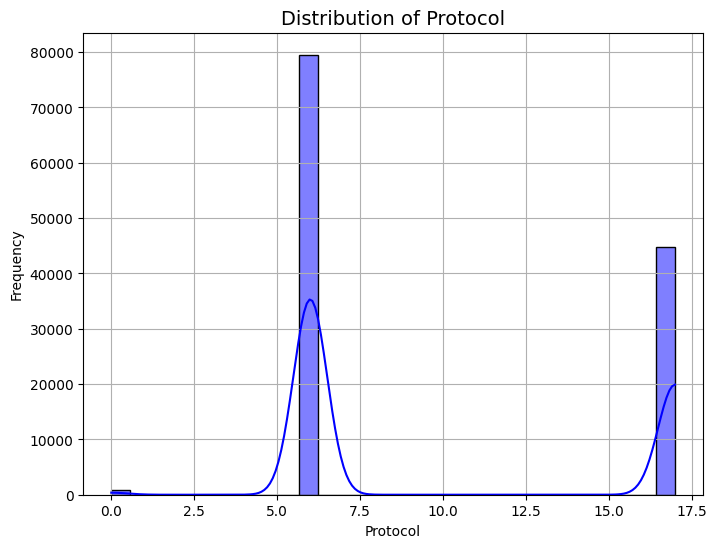

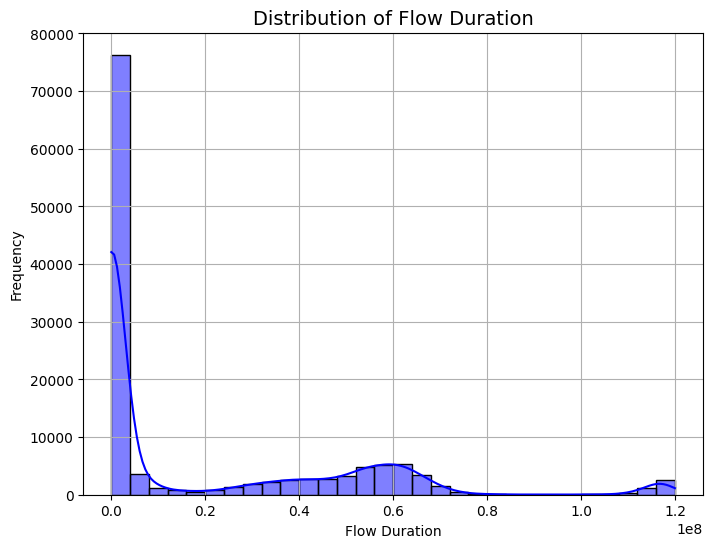

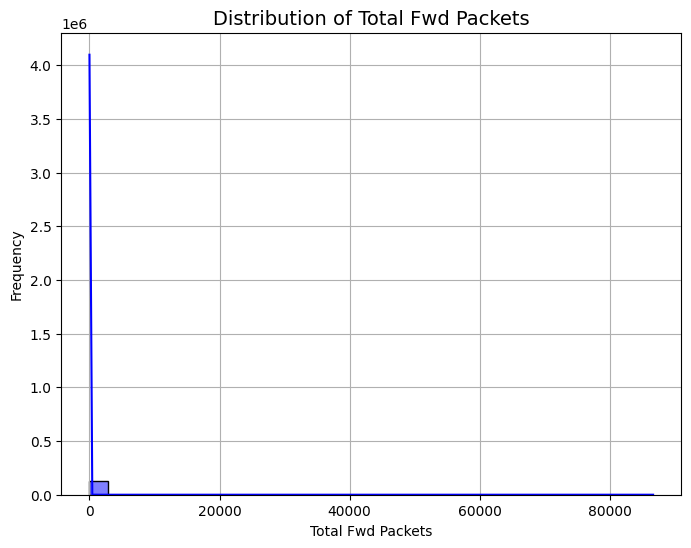

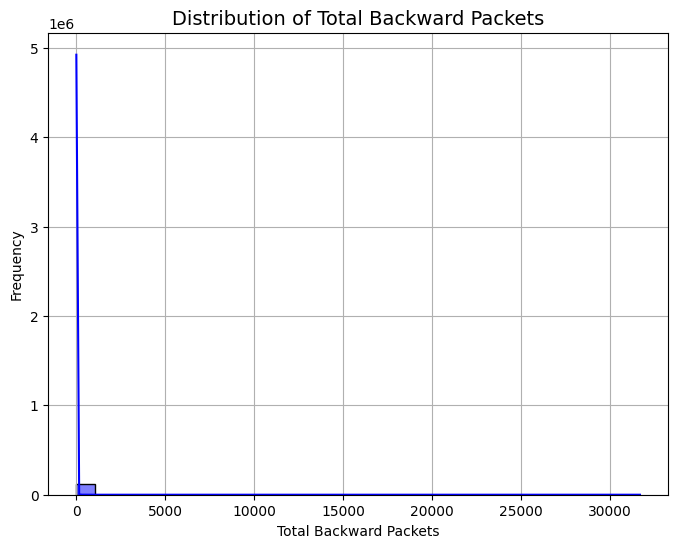

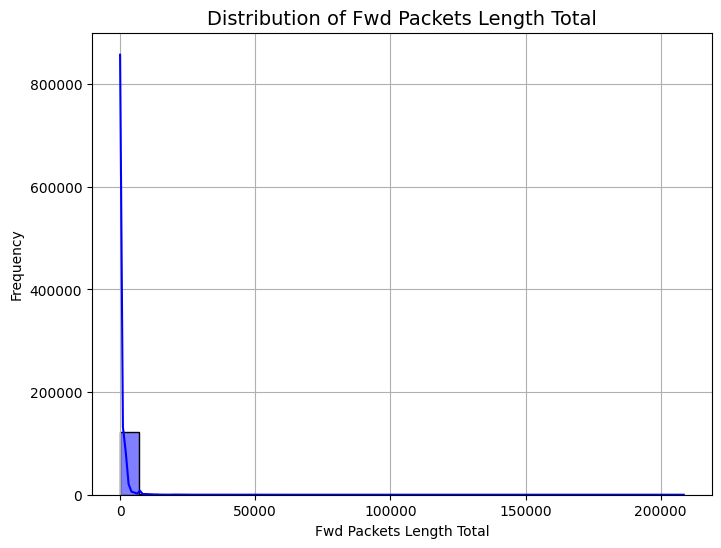

...

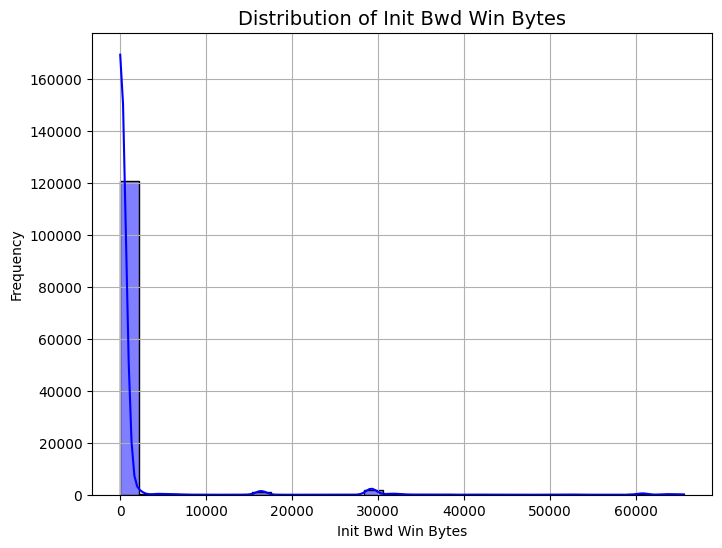

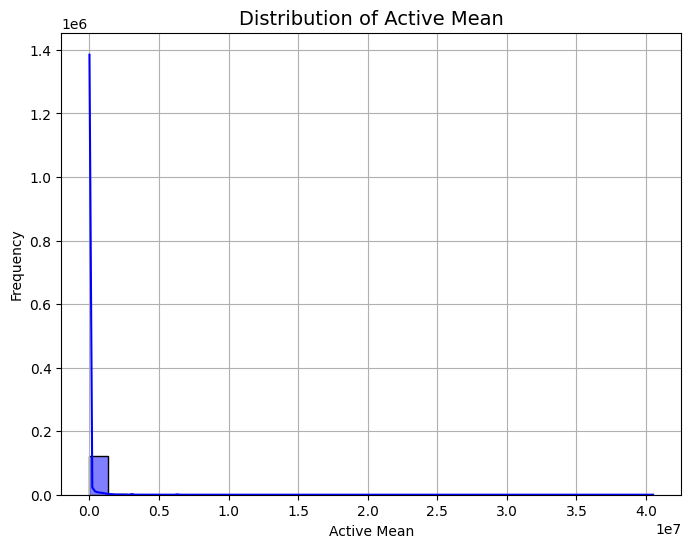

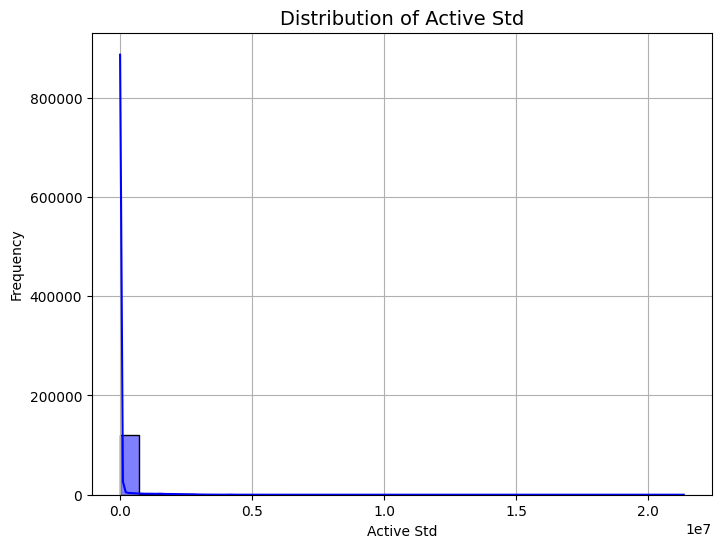

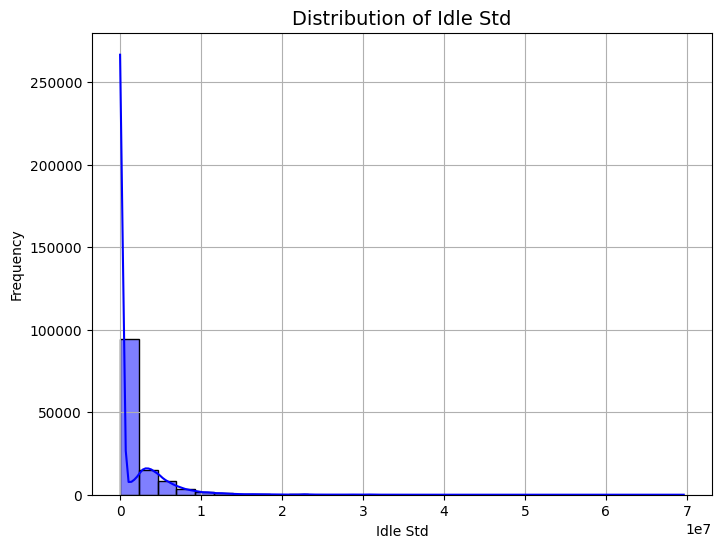

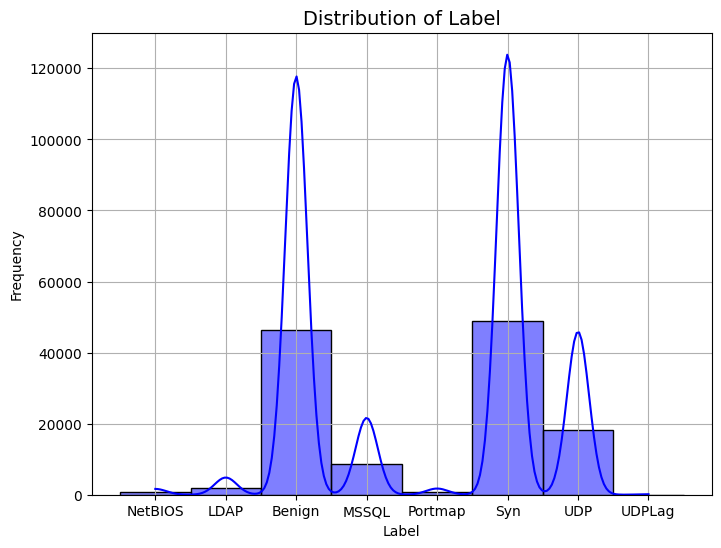

In [ ]:
for feature in trained_df.columns:
    plt.figure(figsize=(8, 6))

    # Plot the histogram with KDE
    sns.histplot(data[feature], kde=True, color='blue', bins=30)

    plt.title(f'Distribution of {feature}', fontsize=14)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)

    plt.show()

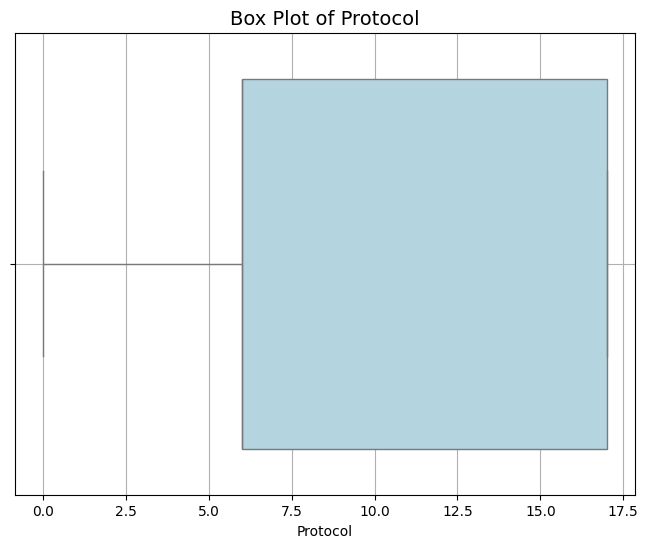

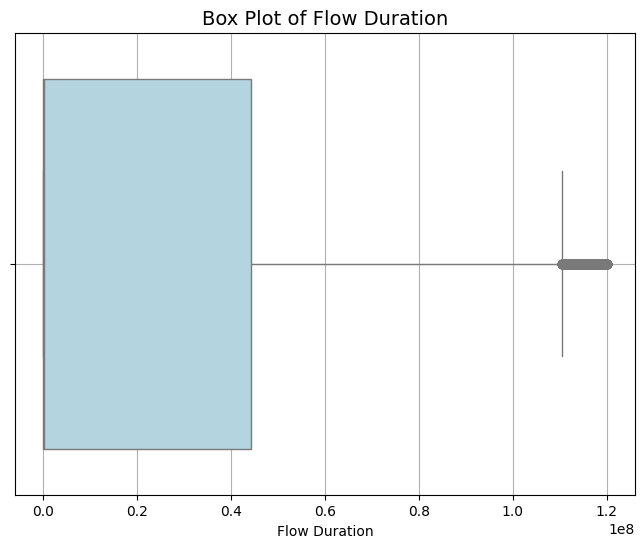

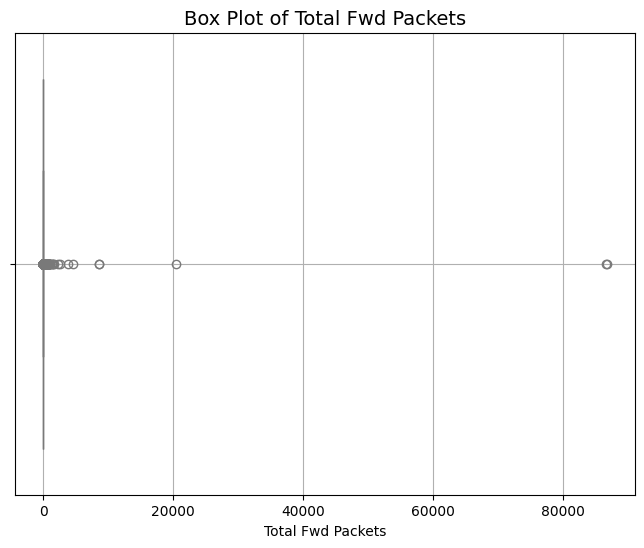

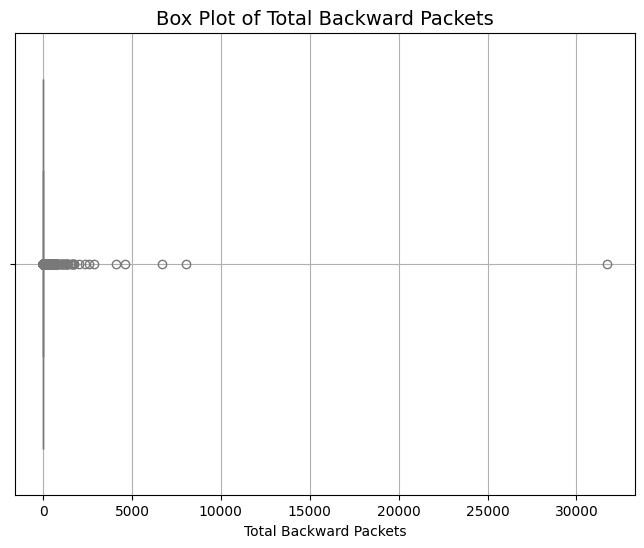

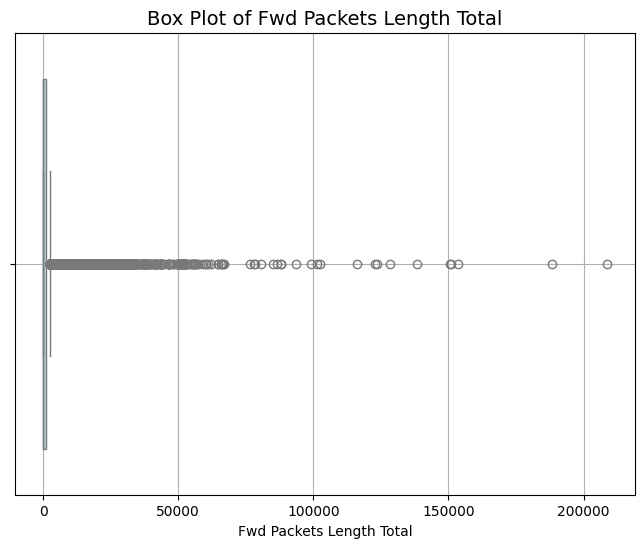

...

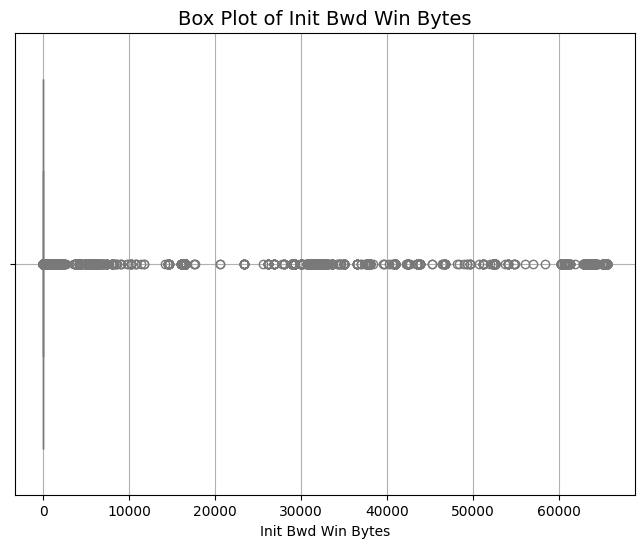

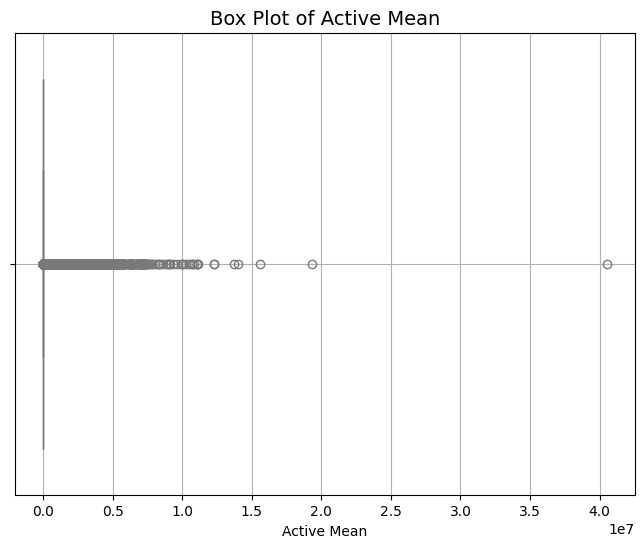

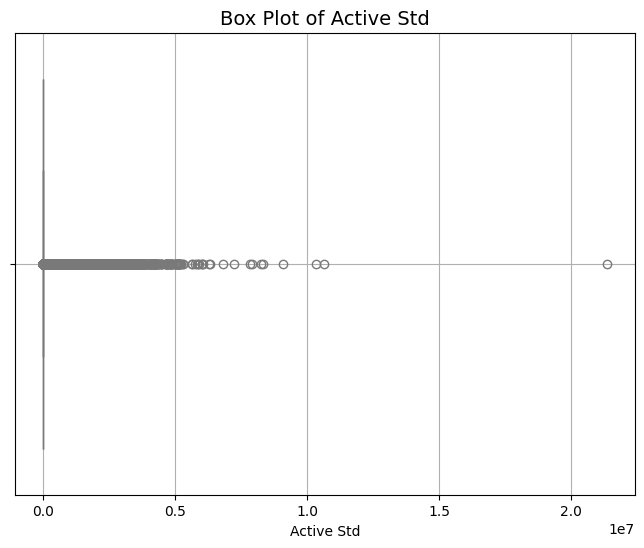

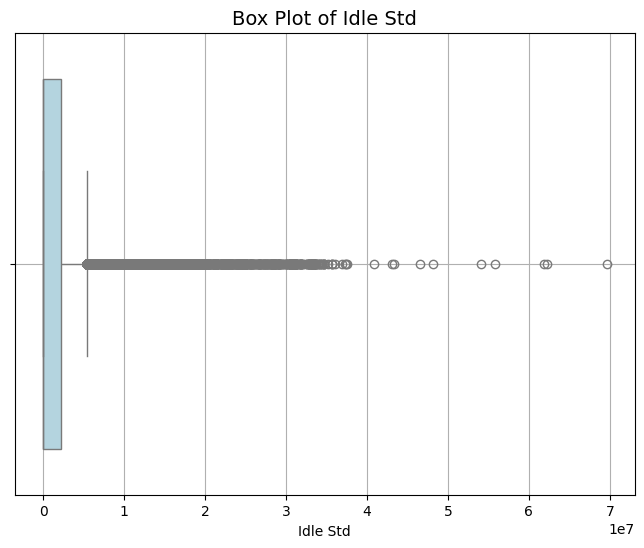

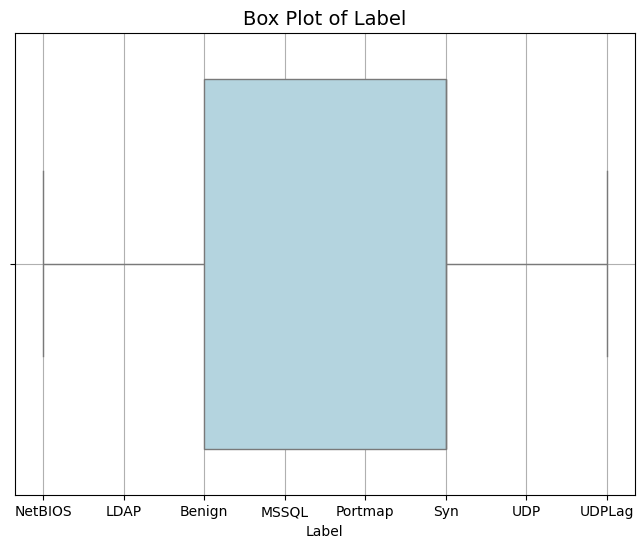

In [ ]:
for feature in trained_df.columns:
    plt.figure(figsize=(8, 6))

    # Plot the box plot
    sns.boxplot(x=data[feature], color='lightblue')

    plt.title(f'Box Plot of {feature}', fontsize=14)
    plt.xlabel(feature)
    plt.grid(True)

    plt.show()


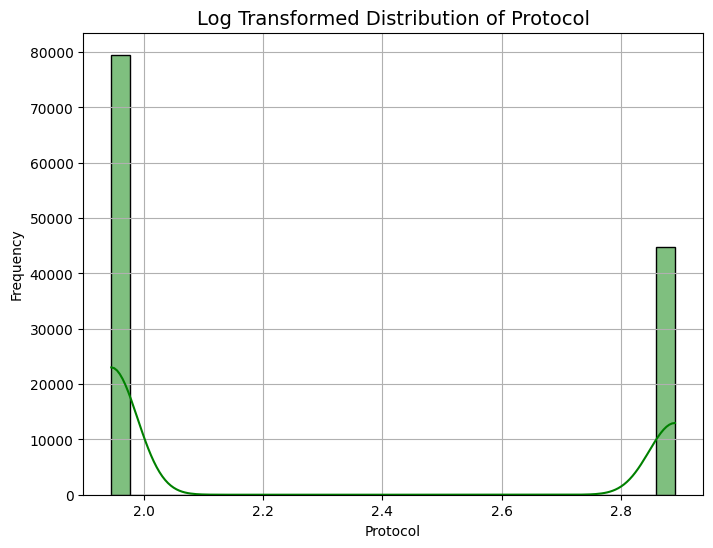

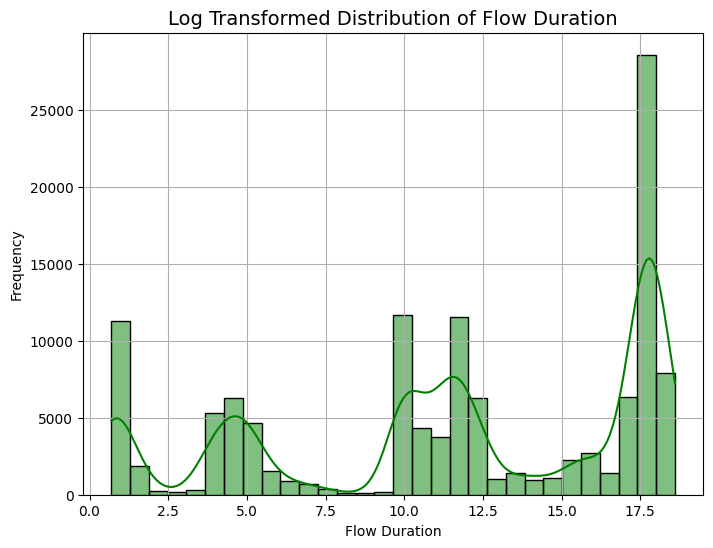

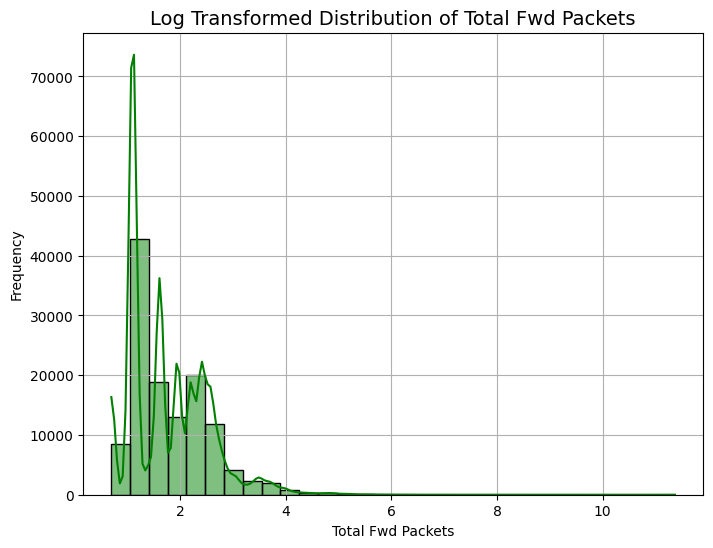

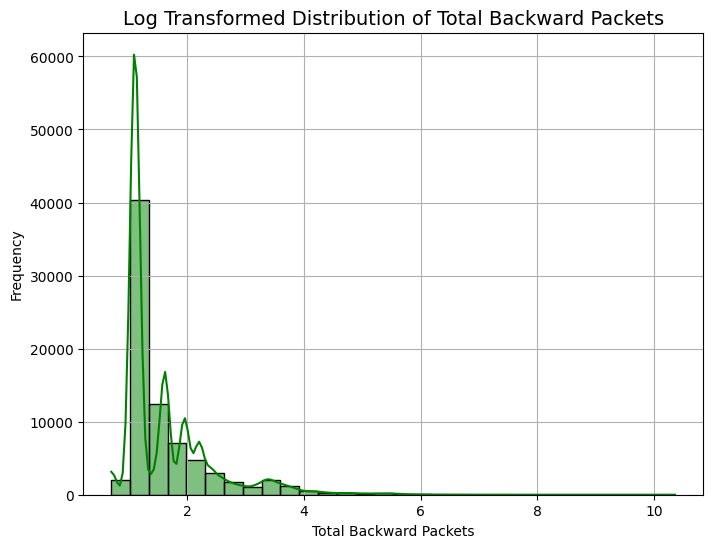

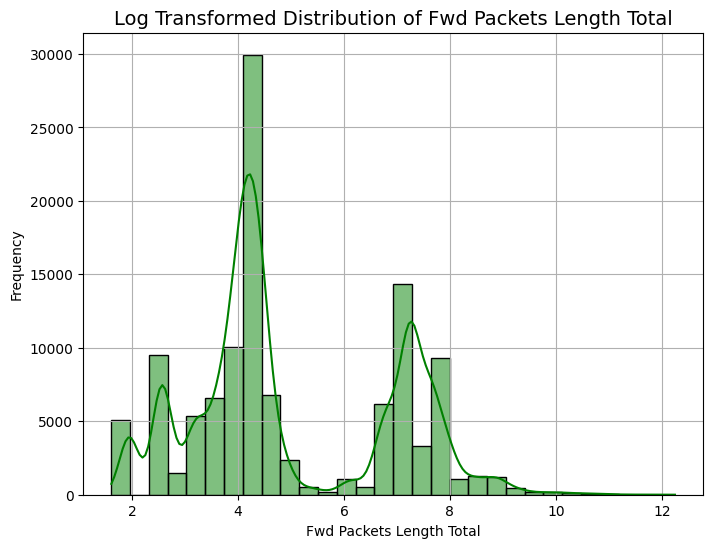

...

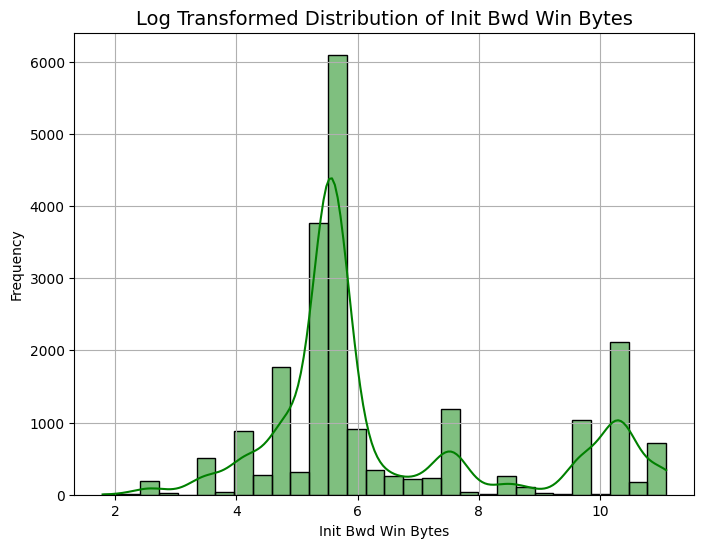

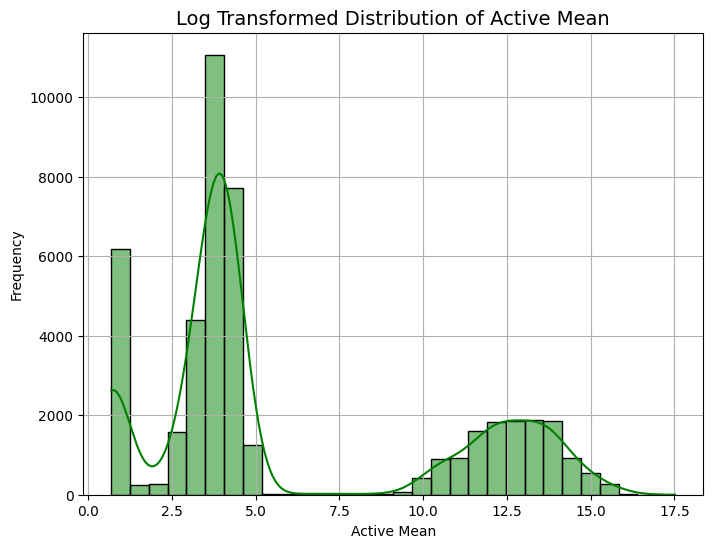

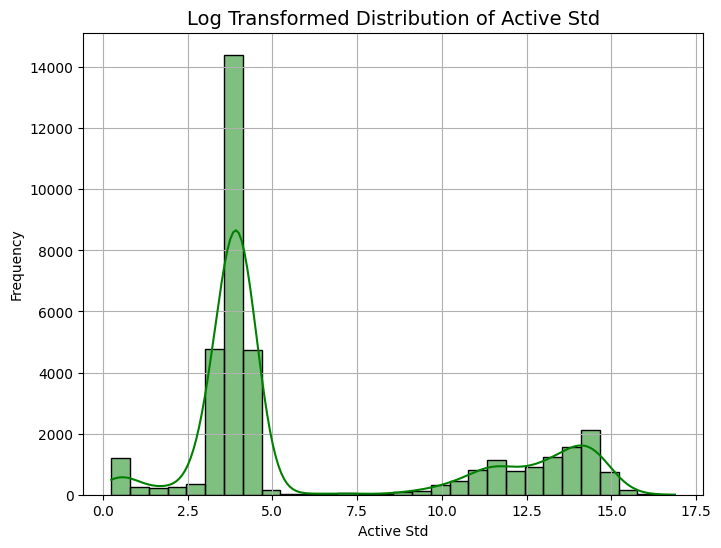

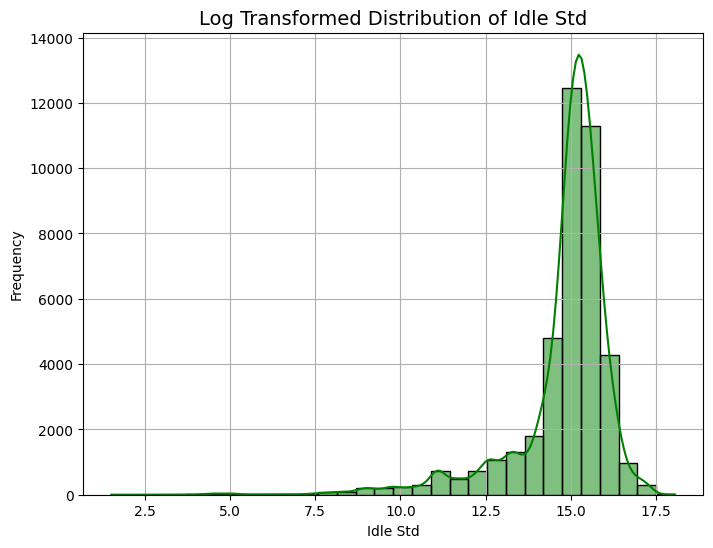

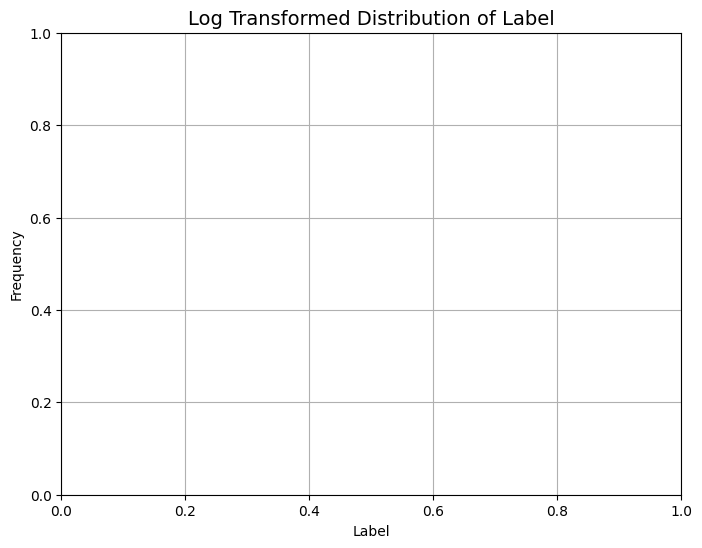

In [ ]:
for feature in trained_df.columns:
    plt.figure(figsize=(8, 6))


    numeric_data = pd.to_numeric(data[feature], errors='coerce')
    numeric_data = numeric_data.dropna()


    log_transformed = np.log1p(numeric_data[numeric_data > 0])  # Handles log(1+x) and avoids log(0) or negatives

    # Plot the distribution after log transformation
    sns.histplot(log_transformed, kde=True, color='green', bins=30)

    plt.title(f'Log Transformed Distribution of {feature}', fontsize=14)
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.grid(True)

    plt.show()

In [20]:
def remove_outliers_iqr(df):

    df_clean = df.copy()


    for feature in df_clean.select_dtypes(include=[float, int]).columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df_clean[feature].quantile(0.25)
        Q3 = df_clean[feature].quantile(0.75)


        IQR = Q3 - Q1


        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Find outliers (those outside of the bounds)
        outliers = df_clean[(df_clean[feature] < lower_bound) | (df_clean[feature] > upper_bound)]

        # Print the number of outliers detected
        print(f"Feature '{feature}': Detected {len(outliers)} outliers")

        # Remove the outliers
        df_clean = df_clean[(df_clean[feature] >= lower_bound) & (df_clean[feature] <= upper_bound)]

    return df_clean


cleaned_df = remove_outliers_iqr(trained_df)

# Check the shape before and after outlier removal
print(f"Original shape: {trained_df.shape}")
print(f"Shape after outlier removal: {cleaned_df.shape}")

Feature 'Protocol': Detected 0 outliers
Feature 'Flow Duration': Detected 4018 outliers
Feature 'Total Fwd Packets': Detected 4217 outliers
Feature 'Total Backward Packets': Detected 15143 outliers
Feature 'Fwd Packets Length Total': Detected 2976 outliers
Feature 'Fwd Packet Length Max': Detected 465 outliers
Feature 'Fwd Packet Length Min': Detected 362 outliers
Feature 'Fwd Packet Length Std': Detected 22060 outliers
Feature 'Bwd Packet Length Max': Detected 14710 outliers
Feature 'Bwd Packet Length Min': Detected 0 outliers
Feature 'Flow Bytes/s': Detected 12081 outliers
Feature 'Flow Packets/s': Detected 5282 outliers
Feature 'Flow IAT Mean': Detected 141 outliers
Feature 'Flow IAT Min': Detected 5201 outliers
Feature 'Bwd IAT Total': Detected 9183 outliers
Feature 'Bwd IAT Mean': Detected 3138 outliers
Feature 'Bwd IAT Min': Detected 525 outliers
Feature 'Fwd PSH Flags': Detected 41 outliers
Feature 'Fwd Header Length': Detected 109 outliers
Feature 'Bwd Header Length': Detected 

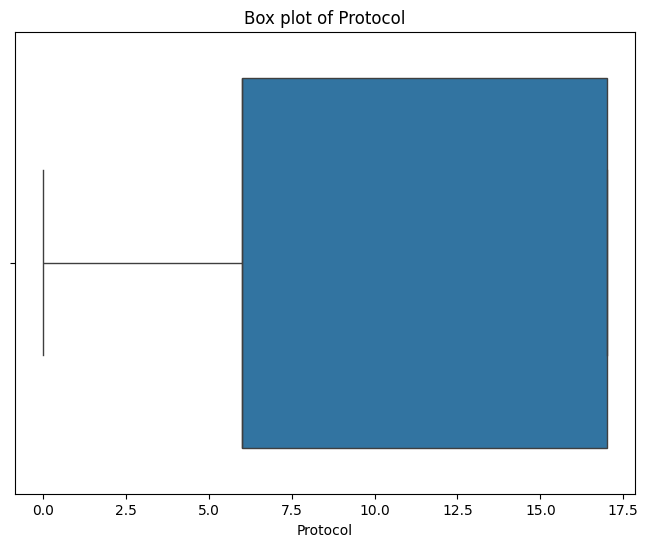

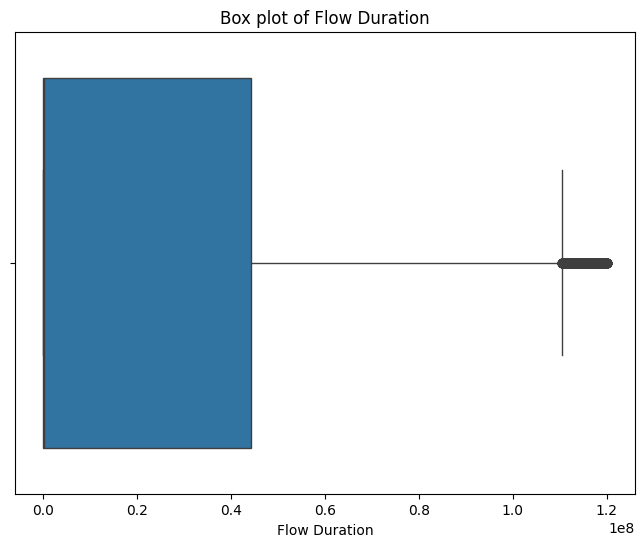

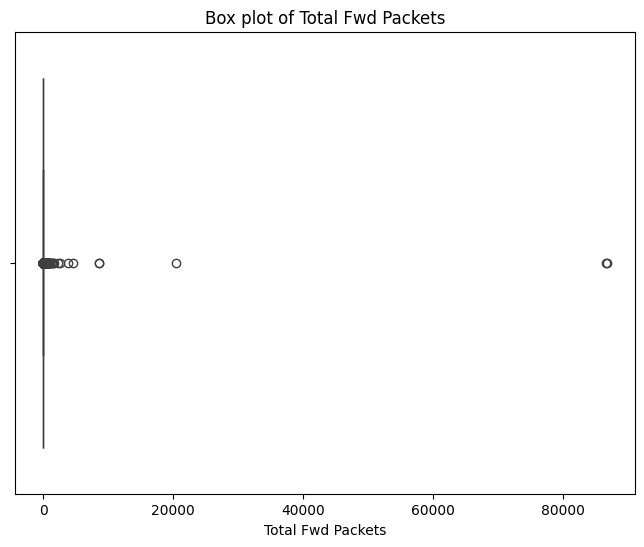

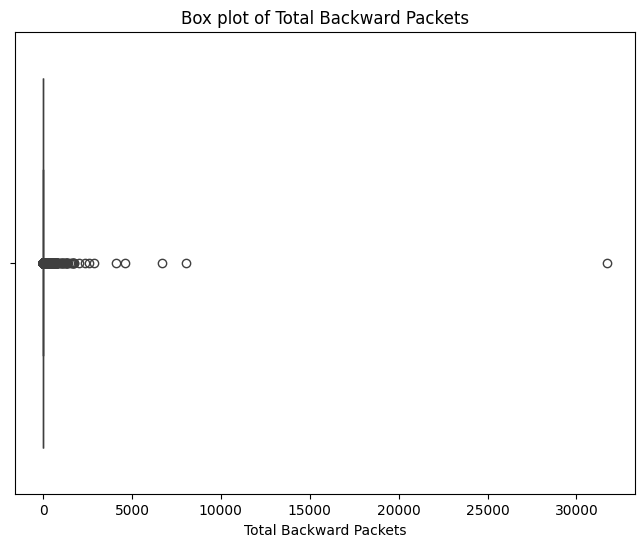

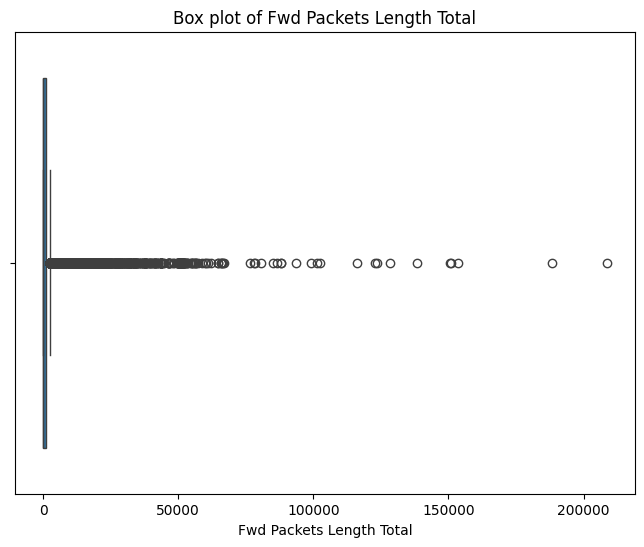

...

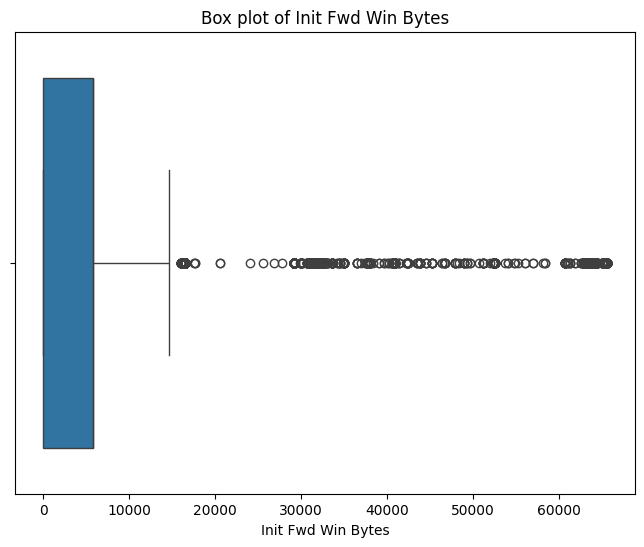

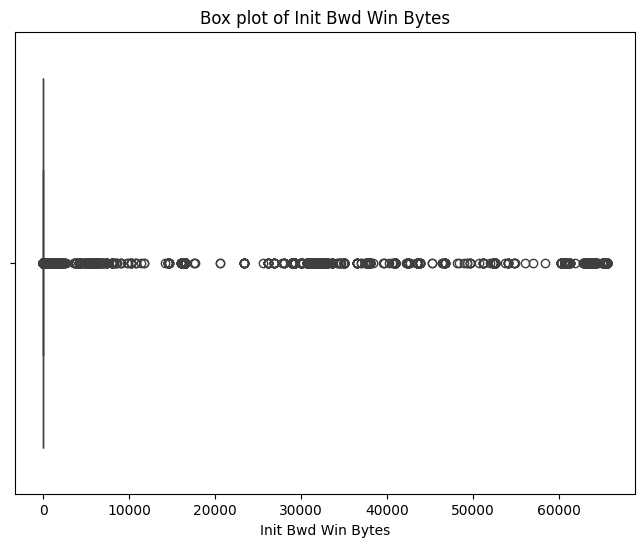

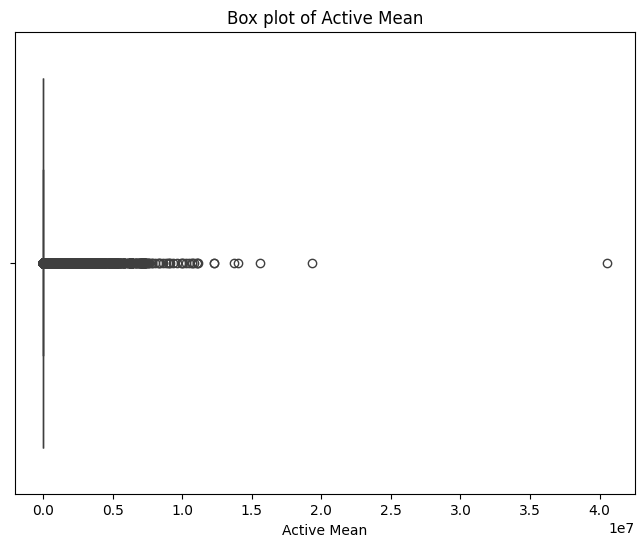

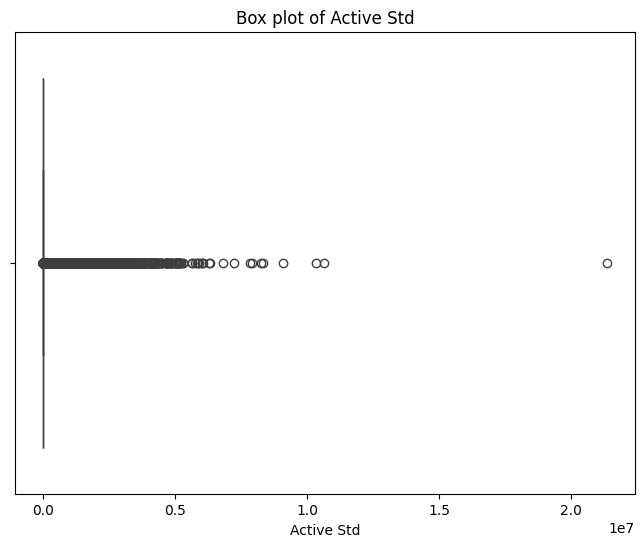

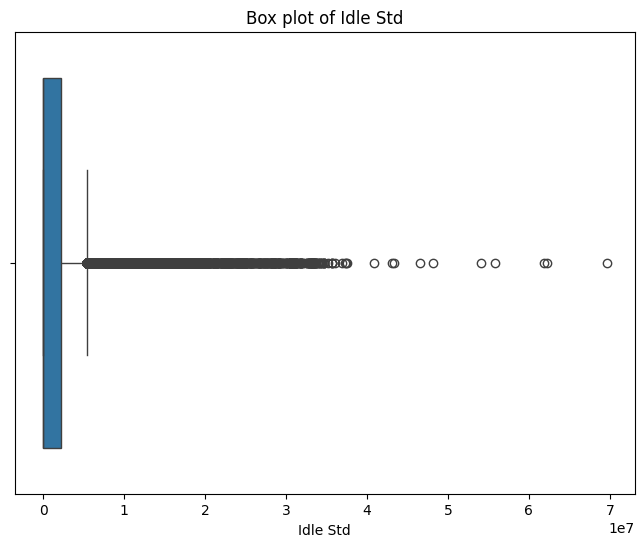

In [ ]:
def visualize_outliers_all_columns(df):
    # Get only numeric columns (int, float) for plotting
    numeric_columns = df.select_dtypes(include=[float, int]).columns

    # Loop through each numeric column and plot the boxplot
    for feature in numeric_columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(data=df, x=feature)
        plt.title(f"Box plot of {feature}")
        plt.show()

# Example usage to visualize outliers for all numeric columns
visualize_outliers_all_columns(trained_df)

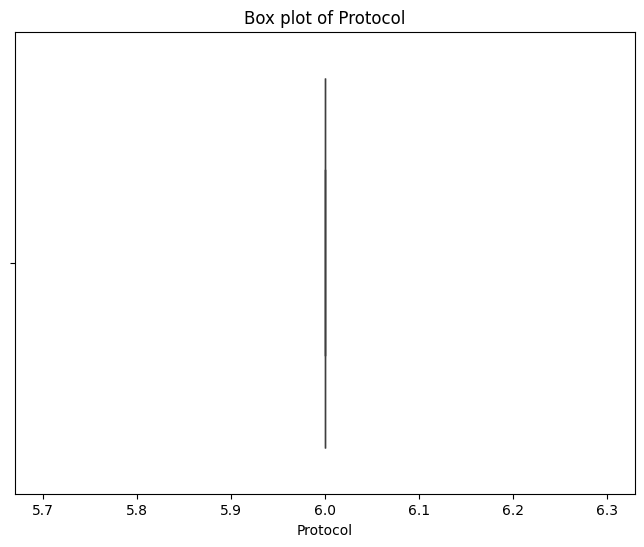

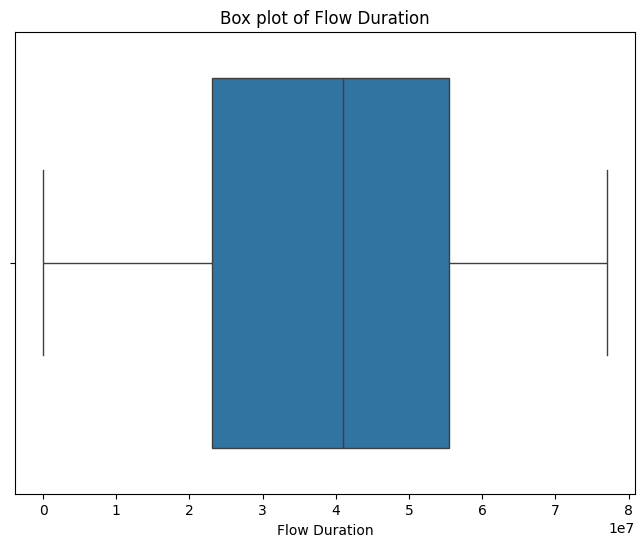

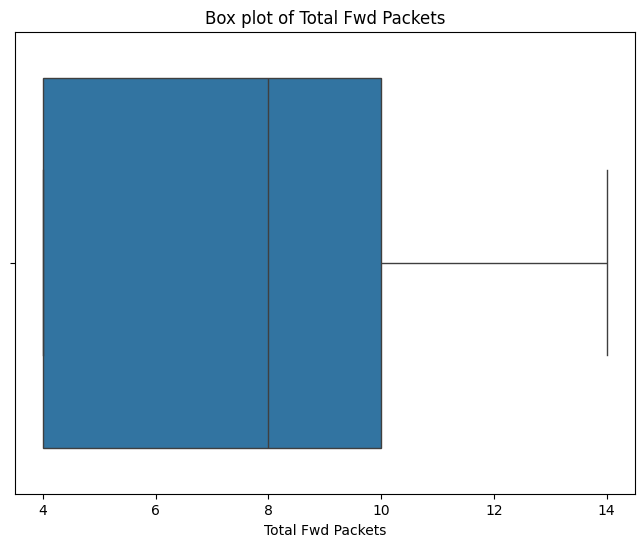

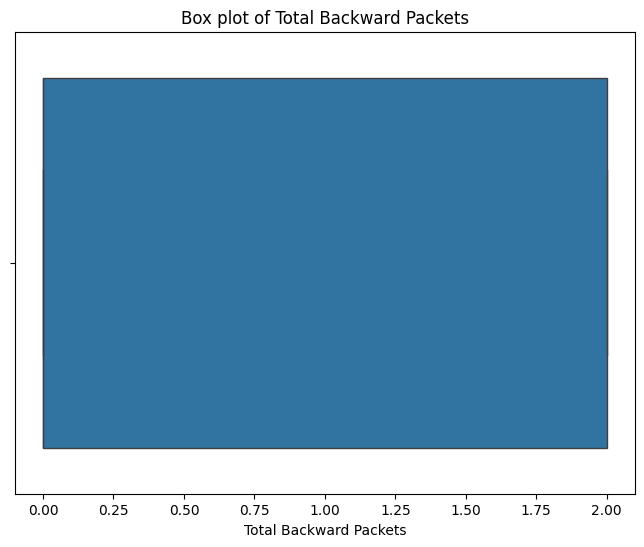

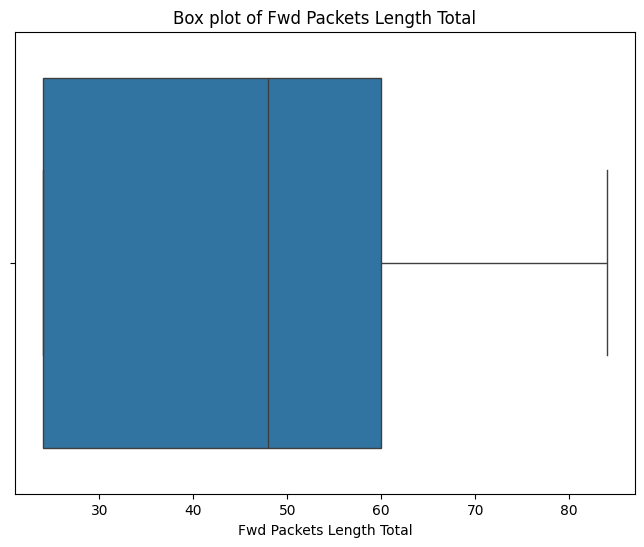

...

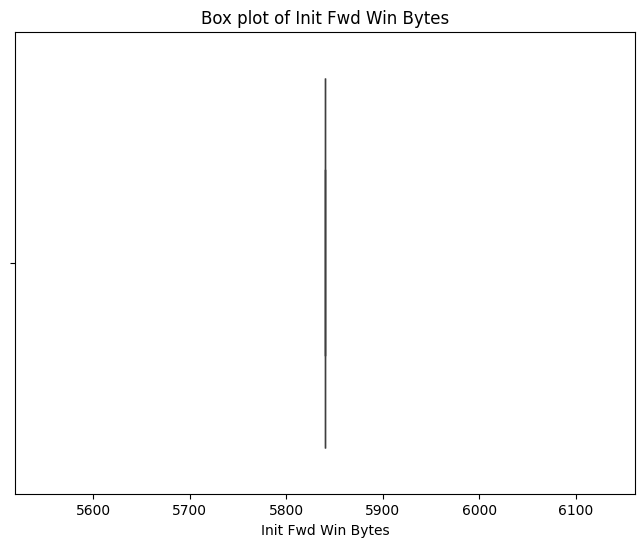

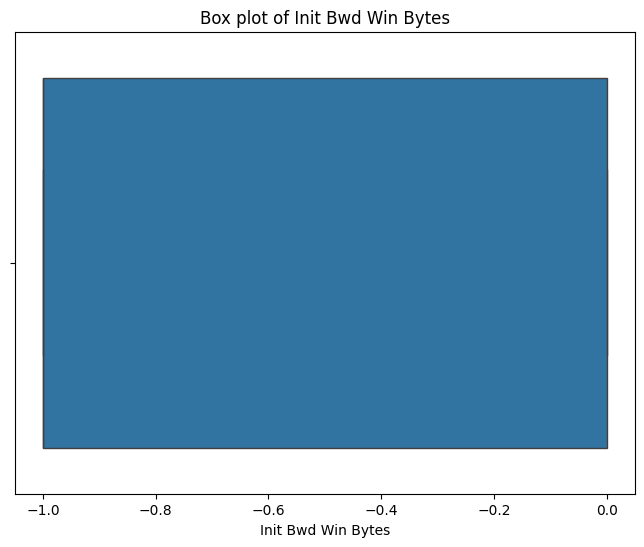

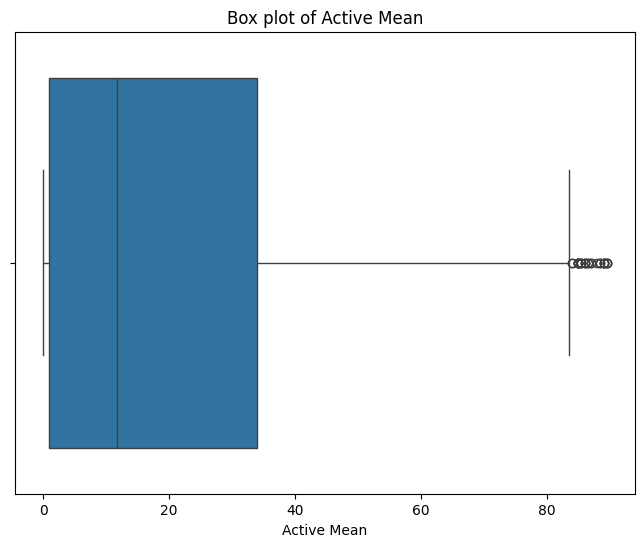

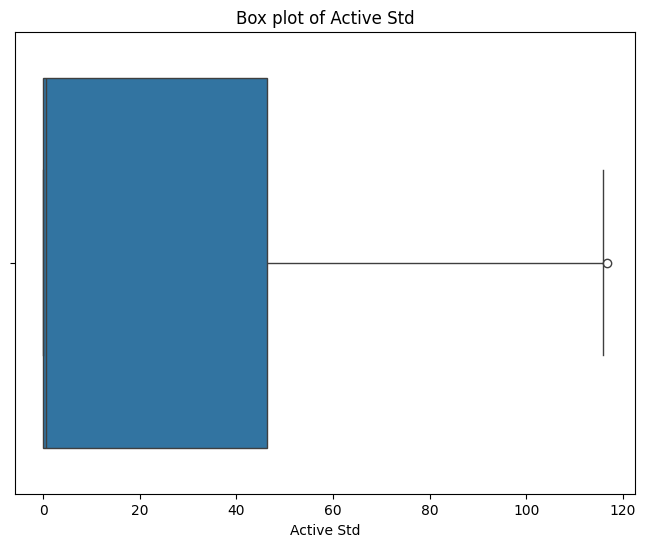

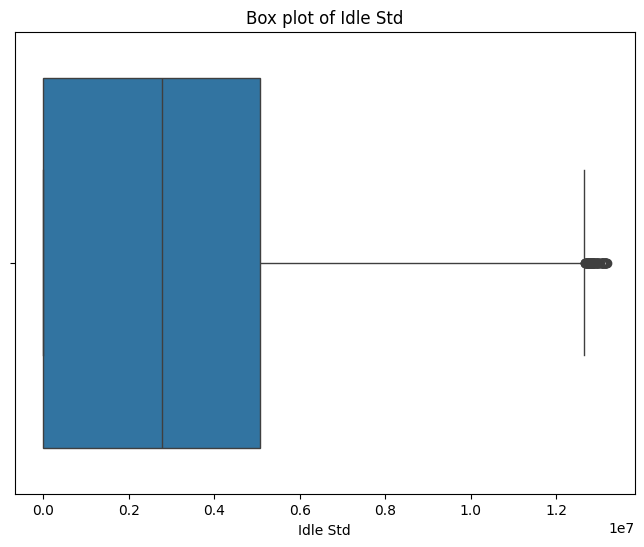

In [ ]:
visualize_outliers_all_columns(cleaned_df)

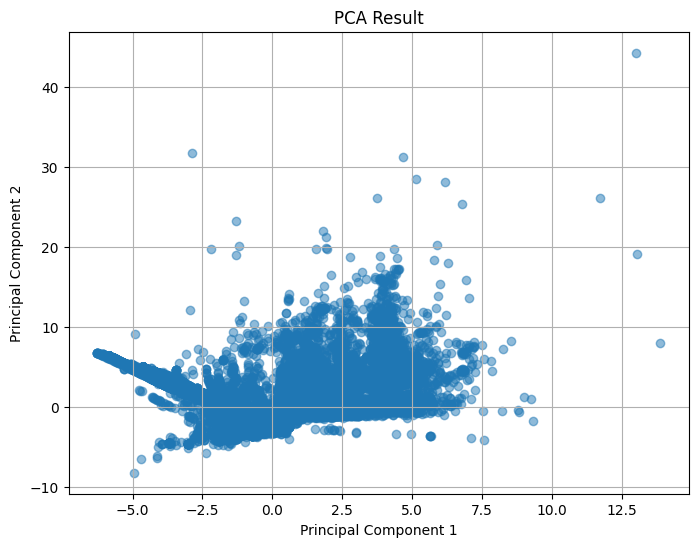

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


numeric_features = trained_df.select_dtypes(include=[float, int]).columns
X = trained_df[numeric_features]


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applying PCA
pca = PCA(n_components=2)  # You can choose the number of components
X_pca = pca.fit_transform(X_scaled)

# Plotting the PCA result
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], alpha=0.5)
plt.title('PCA Result')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

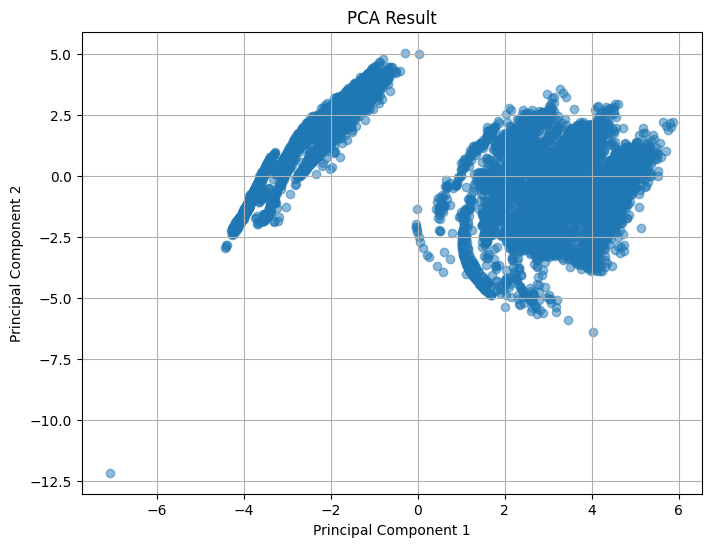

In [ ]:
numeric_features2 = trained_df.select_dtypes(include=[float, int]).columns
X2 = cleaned_df[numeric_features2]


scaler = StandardScaler()
X_scaled2 = scaler.fit_transform(X2)

# Applying PCA
pca2 = PCA(n_components=2)  # You can choose the number of components
X_pca2 = pca2.fit_transform(X_scaled2)

# Plotting the PCA result
plt.figure(figsize=(8, 6))
plt.scatter(X_pca2[:, 0], X_pca2[:, 1], alpha=0.5)
plt.title('PCA Result')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid()
plt.show()

In [20]:
# X = trained_df.drop(columns=['Label'])
# y = trained_df['Label']


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
X = trained_df.drop(columns=['Label'])
y = trained_df['Label']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


rf_model = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)


rf_model.fit(X_train, y_train)


rf_predictions = rf_model.predict(X_test)


rf_accuracy = accuracy_score(y_test, rf_predictions)
rf_precision = precision_score(y_test, rf_predictions, average='weighted')
rf_recall = recall_score(y_test, rf_predictions, average='weighted')
rf_f1 = f1_score(y_test, rf_predictions, average='weighted')
rf_confusion_matrix = confusion_matrix(y_test, rf_predictions)
rf_roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test), multi_class='ovr')  # For binary classification

# Print evaluation metrics
print(f'Random Forest Accuracy: {rf_accuracy:.4f}')
print(f'Random Forest Precision: {rf_precision:.4f}')
print(f'Random Forest Recall: {rf_recall:.4f}')
print(f'Random Forest F1 Score: {rf_f1:.4f}')
print('Random Forest Confusion Matrix:')
print(rf_confusion_matrix)
print(f'Random Forest ROC AUC Score: {rf_roc_auc:.4f}')

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, rf_predictions))

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Random Forest Accuracy: 0.9886
Random Forest Precision: 0.9884
Random Forest Recall: 0.9886
Random Forest F1 Score: 0.9881
Random Forest Confusion Matrix:
[[9242    0    0    0    0    0    0    0]
 [   2  338   30    0    0    0    0    0]
 [   1   29 1671    0    0    1   15    0]
 [   0    0    1  114   17    0    1    0]
 [   3    0    7   67   53    5    1    0]
 [  12    0   10    0    2 9825    3    0]
 [   0    0   64    2    0    1 3506    0]
 [   1    0    2    0    0    2    6    0]]
Random Forest ROC AUC Score: 0.9968

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

      Benign       1.00      1.00      1.00      9242
        LDAP       0.92      0.91      0.92       370
       MSSQL       0.94      0.97      0.95      1717
     NetBIOS       0.62      0.86      0.72       133
     Portmap       0.74      0.39      0.51       136
         Syn       1.00      1.00      1.00      9852
         UDP       0.99      0.98      0.99      3573
      UDPLag       0.00      0.00      0.00        11

    accuracy                           0.99     25034
   macro avg       0.78      0.76      0.76     25034
weighted avg       0.99      0.99      0.99     25034



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


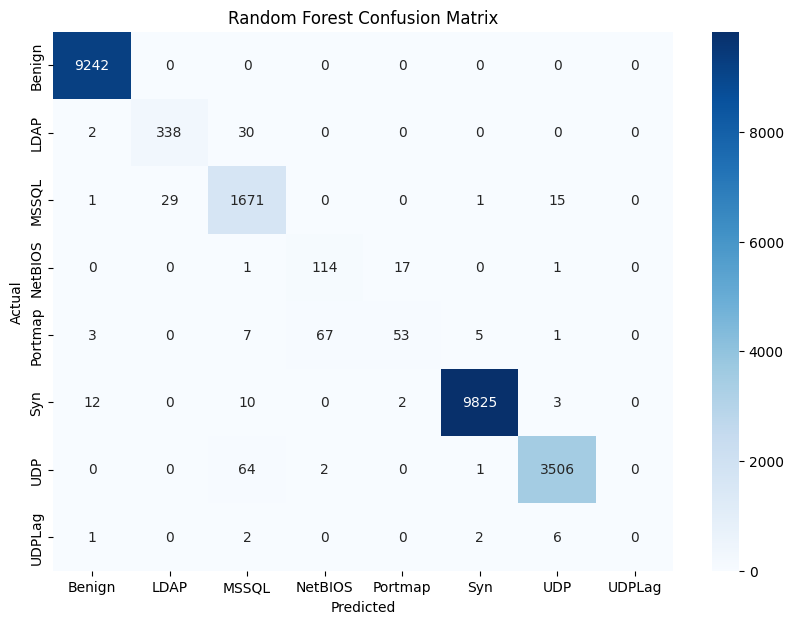

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(rf_confusion_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=rf_model.classes_, yticklabels=rf_model.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Random Forest Confusion Matrix')
plt.show()

<ipython-input-29-d2b627cbe861>:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', n_classes)  # Use tab10 colormap for distinct colors


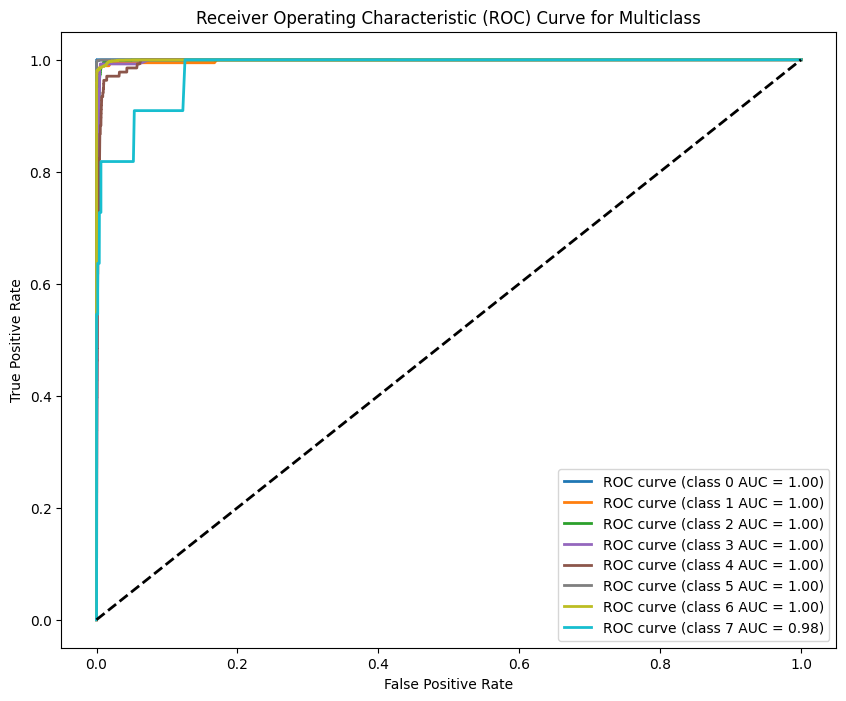

In [ ]:
y_bin = label_binarize(y_test, classes=rf_model.classes_)
n_classes = y_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], rf_model.predict_proba(X_test)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Generate colors dynamically
colors = plt.cm.get_cmap('tab10', n_classes)  # Use tab10 colormap for distinct colors

# Plotting ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2, label='ROC curve (class {0} AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

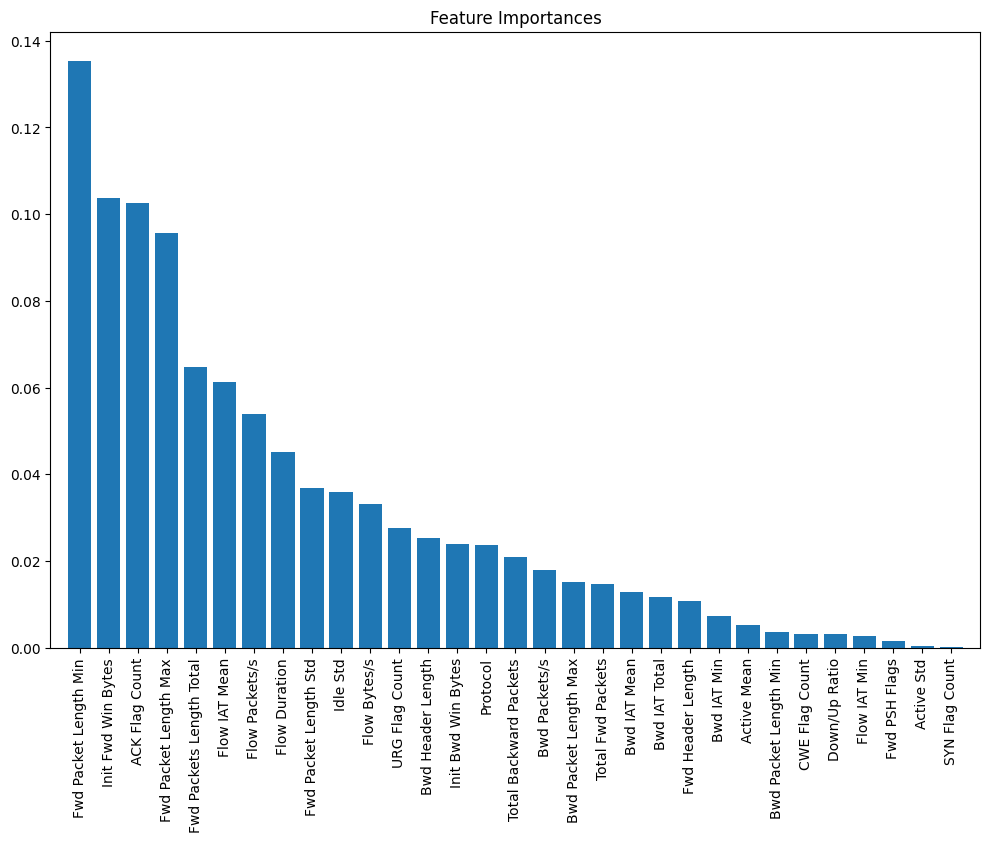

In [ ]:
importances = rf_model.feature_importances_
feature_names = X.columns
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 8))
plt.title("Feature Importances")
plt.bar(range(X.shape[1]), importances[indices], align="center")
plt.xticks(range(X.shape[1]), feature_names[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

In [ ]:
import joblib

# Save the model
joblib.dump(rf_model, 'random_forest_model_pred.pkl')

# To download the model file
from google.colab import files
files.download('random_forest_model_pred.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)


gb_model.fit(X_train, y_train)

# Make predictions
gb_predictions = gb_model.predict(X_test)

# Calculate evaluation metrics
gb_accuracy = accuracy_score(y_test, gb_predictions)
gb_precision = precision_score(y_test, gb_predictions, average='weighted')
gb_recall = recall_score(y_test, gb_predictions, average='weighted')
gb_f1 = f1_score(y_test, gb_predictions, average='weighted')
gb_confusion_matrix = confusion_matrix(y_test, gb_predictions)
gb_roc_auc = roc_auc_score(y_test, gb_model.predict_proba(X_test), multi_class='ovr')  # For multi-class classification

# Print evaluation metrics
print(f'Gradient Boosting Accuracy: {gb_accuracy:.4f}')
print(f'Gradient Boosting Precision: {gb_precision:.4f}')
print(f'Gradient Boosting Recall: {gb_recall:.4f}')
print(f'Gradient Boosting F1 Score: {gb_f1:.4f}')
print('Gradient Boosting Confusion Matrix:')
print(gb_confusion_matrix)
print(f'Gradient Boosting ROC AUC Score (OvR): {gb_roc_auc:.4f}')

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, gb_predictions))

Gradient Boosting Accuracy: 0.9867
Gradient Boosting Precision: 0.9892
Gradient Boosting Recall: 0.9867
Gradient Boosting F1 Score: 0.9875
Gradient Boosting Confusion Matrix:
[[9236    0    0    0    1    1    1    3]
 [   0  346   23    0    0    0    1    0]
 [   1   27 1657    2    0    1   16   13]
 [   1    0    1   95   12    0    4   20]
 [   4    0    5   47   54    5    2   19]
 [  16    0    5    0    1 9822    0    8]
 [   0    0   59    3    5    1 3484   21]
 [   1    0    1    0    0    2    1    6]]
Gradient Boosting ROC AUC Score (OvR): 0.9410

Classification Report:
              precision    recall  f1-score   support

      Benign       1.00      1.00      1.00      9242
        LDAP       0.93      0.94      0.93       370
       MSSQL       0.95      0.97      0.96      1717
     NetBIOS       0.65      0.71      0.68       133
     Portmap       0.74      0.40      0.52       136
         Syn       1.00      1.00      1.00      9852
         UDP       0.99      0.

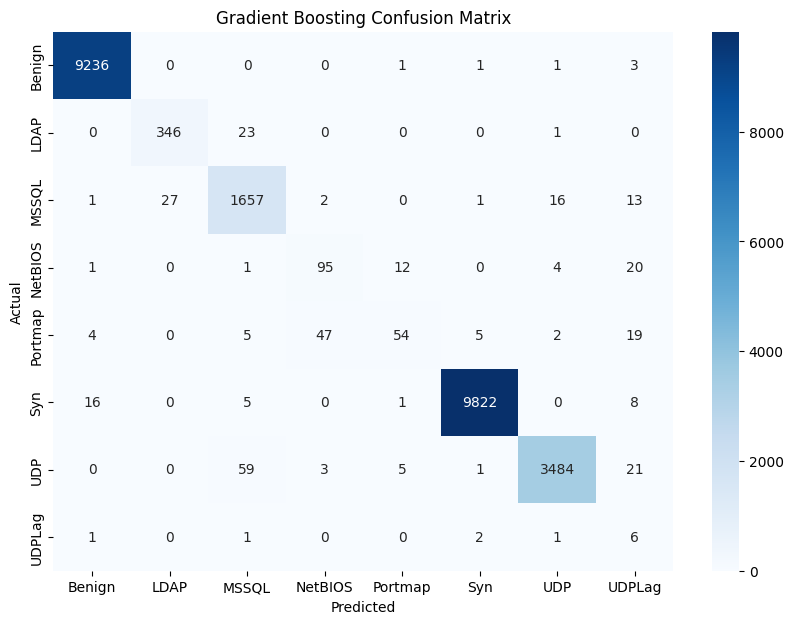

In [ ]:
plt.figure(figsize=(10, 7))
sns.heatmap(gb_confusion_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=gb_model.classes_, yticklabels=gb_model.classes_)
plt.title('Gradient Boosting Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

<ipython-input-32-a658f08ec9d1>:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', n_classes)


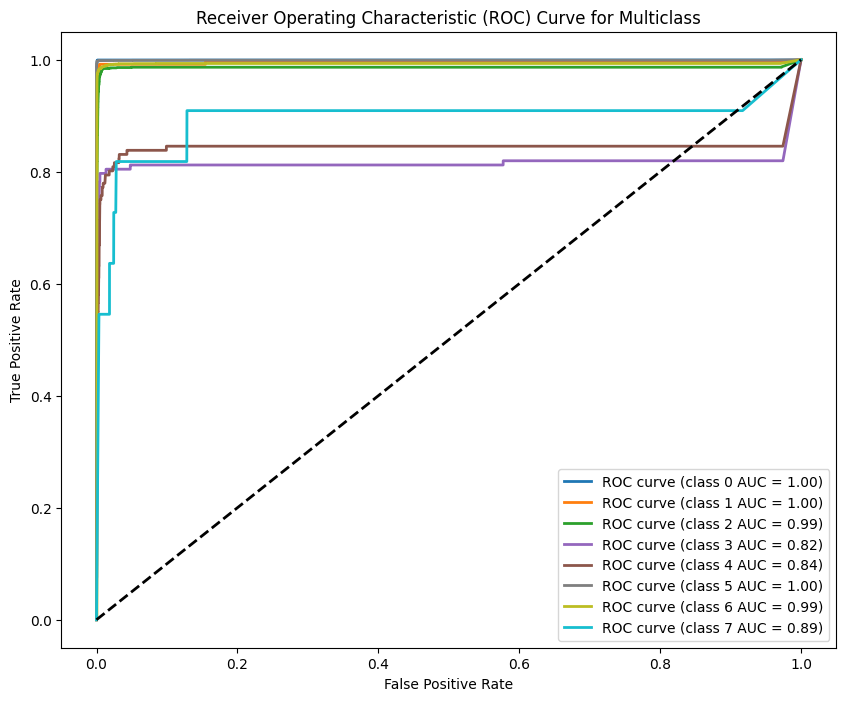

In [ ]:


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], gb_model.predict_proba(X_test)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Generate colors dynamically
colors = plt.cm.get_cmap('tab10', n_classes)

# Plotting ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], color=colors(i), lw=2, label='ROC curve (class {0} AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.title('Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

In [ ]:
import joblib

# Save the model
joblib.dump(gb_model, 'gradient_boosting_model_pred.pkl')

# To download the model file
from google.colab import files
files.download('gradient_boosting_model_pred.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize the Support Vector Machine model
svm_model = SVC(C=1.0, kernel='rbf', probability=True, random_state=42)

# Train the model on scaled data
svm_model.fit(X_train_scaled, y_train)

# Make predictions
svm_predictions = svm_model.predict(X_test_scaled)

# Calculate evaluation metrics
svm_accuracy = accuracy_score(y_test, svm_predictions)
svm_precision = precision_score(y_test, svm_predictions, average='weighted')
svm_recall = recall_score(y_test, svm_predictions, average='weighted')
svm_f1 = f1_score(y_test, svm_predictions, average='weighted')
svm_confusion_matrix = confusion_matrix(y_test, svm_predictions)


svm_roc_auc = roc_auc_score(y_test, svm_model.predict_proba(X_test_scaled), multi_class='ovr')

# Print evaluation metrics
print(f'Support Vector Machine Accuracy: {svm_accuracy:.4f}')
print(f'Support Vector Machine Precision: {svm_precision:.4f}')
print(f'Support Vector Machine Recall: {svm_recall:.4f}')
print(f'Support Vector Machine F1 Score: {svm_f1:.4f}')
print('Support Vector Machine Confusion Matrix:')
print(svm_confusion_matrix)
print(f'Support Vector Machine ROC AUC Score (OvR): {svm_roc_auc:.4f}')

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, svm_predictions))


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Support Vector Machine Accuracy: 0.9797
Support Vector Machine Precision: 0.9773
Support Vector Machine Recall: 0.9797
Support Vector Machine F1 Score: 0.9778
Support Vector Machine Confusion Matrix:
[[9230    1    0    7    0    4    0    0]
 [   2  344   24    0    0    0    0    0]
 [   1   51 1664    0    0    1    0    0]
 [   0    0    1  127    0    0    5    0]
 [  12    0    9  109    0    3    3    0]
 [  41    0   11    0    2 9796    2    0]
 [   0    0  206    1    1    0 3365    0]
 [   1    0    3    0    0    2    5    0]]
Support Vector Machine ROC AUC Score (OvR): 0.9645

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

      Benign       0.99      1.00      1.00      9242
        LDAP       0.87      0.93      0.90       370
       MSSQL       0.87      0.97      0.92      1717
     NetBIOS       0.52      0.95      0.67       133
     Portmap       0.00      0.00      0.00       136
         Syn       1.00      0.99      1.00      9852
         UDP       1.00      0.94      0.97      3573
      UDPLag       0.00      0.00      0.00        11

    accuracy                           0.98     25034
   macro avg       0.66      0.72      0.68     25034
weighted avg       0.98      0.98      0.98     25034



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


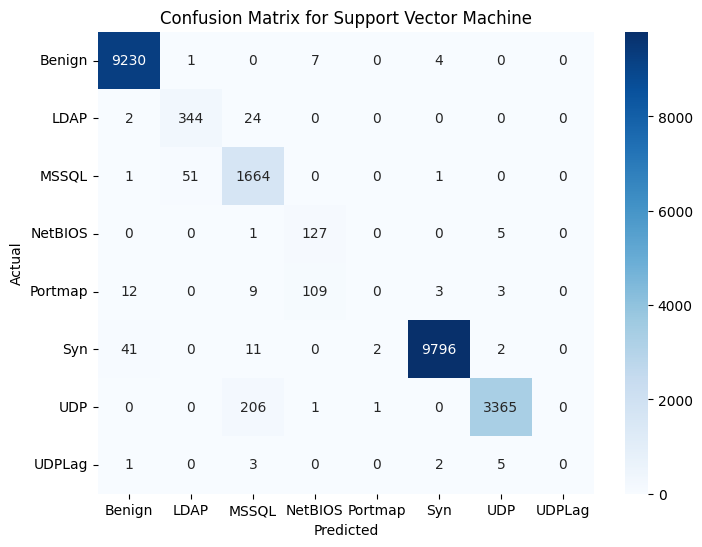

In [ ]:
plt.figure(figsize=(8, 6))
sns.heatmap(svm_confusion_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix for Support Vector Machine')
plt.show()

In [ ]:
n_classes = len(np.unique(y))
fpr = dict()
tpr = dict()
roc_auc = dict()

# Compute ROC curve and ROC area for each class
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test == i, svm_model.predict_proba(X_test_scaled)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plotting the ROC curves
plt.figure(figsize=(10, 8))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label='ROC curve (class {0} AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Support Vector Machine')
plt.legend(loc="lower right")
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1183: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


KeyboardInterrupt: 

In [ ]:
svm_model_filename = 'svm_model.pkl'
joblib.dump(svm_model, svm_model_filename)
print(f'Model saved as {svm_model_filename}')

# Download the model file
files.download(svm_model_filename)

Model saved as svm_model.pkl


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression with 'saga' solver and increased max_iter
lr_model = LogisticRegression(solver='saga', max_iter=5000, C=0.1, random_state=42)

# Train the model on scaled data
lr_model.fit(X_train_scaled, y_train)

# Make predictions
lr_predictions = lr_model.predict(X_test_scaled)

# Calculate evaluation metrics
lr_accuracy = accuracy_score(y_test, lr_predictions)
lr_precision = precision_score(y_test, lr_predictions, average='weighted')
lr_recall = recall_score(y_test, lr_predictions, average='weighted')
lr_f1 = f1_score(y_test, lr_predictions, average='weighted')

# Print evaluation metrics
print(f'Logistic Regression Accuracy: {lr_accuracy:.4f}')
print(f'Logistic Regression Precision: {lr_precision:.4f}')
print(f'Logistic Regression Recall: {lr_recall:.4f}')
print(f'Logistic Regression F1 Score: {lr_f1:.4f}')

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Logistic Regression Accuracy: 0.9738
Logistic Regression Precision: 0.9688
Logistic Regression Recall: 0.9738
Logistic Regression F1 Score: 0.9711


In [23]:
import joblib

joblib.dump(lr_model, 'logistic_regression_pred.pkl')

# To download the model file
from google.colab import files
files.download('logistic_regression_pred.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Logistic Regression Confusion Matrix:
[[9165    4    3   39    5   18    8    0]
 [   0  348   22    0    0    0    0    0]
 [   1   68 1641    0    0    1    6    0]
 [   1    0    1   48    0    0   83    0]
 [   7    0    9   17    0    8   95    0]
 [  51    0   12    0    2 9786    1    0]
 [   0    0  180    1    1    0 3391    0]
 [   1    0    8    0    0    2    0    0]]

Classification Report:


              precision    recall  f1-score   support

      Benign       0.99      0.99      0.99      9242
        LDAP       0.83      0.94      0.88       370
       MSSQL       0.87      0.96      0.91      1717
     NetBIOS       0.46      0.36      0.40       133
     Portmap       0.00      0.00      0.00       136
         Syn       1.00      0.99      1.00      9852
         UDP       0.95      0.95      0.95      3573
      UDPLag       0.00      0.00      0.00        11

    accuracy                           0.97     25034
   macro avg       0.64      0.65      0.64     25034
weighted avg       0.97      0.97      0.97     25034



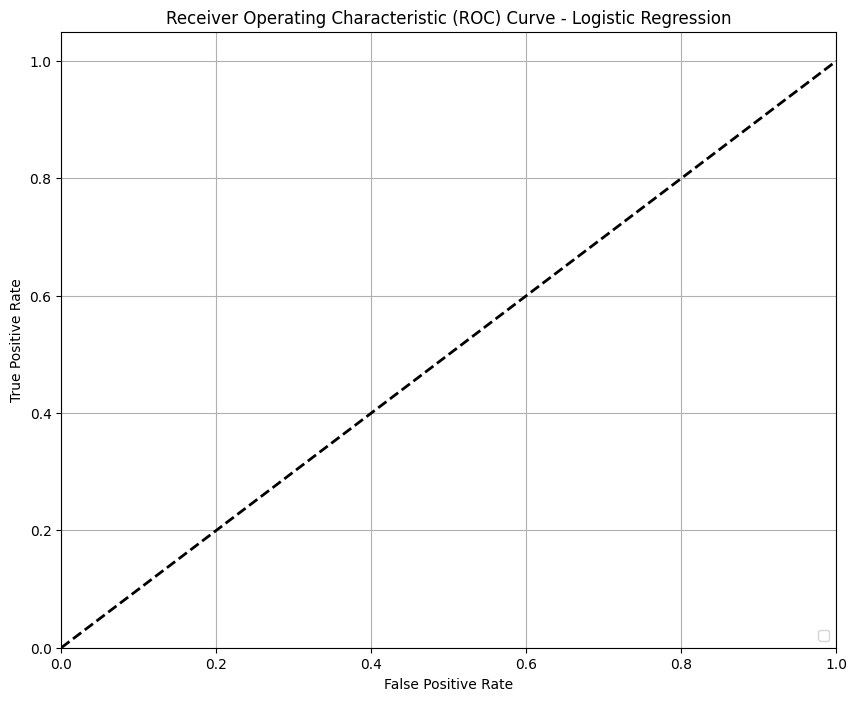

In [28]:
from sklearn.metrics import (confusion_matrix, classification_report,
                             roc_curve, auc)
import numpy as np
import matplotlib.pyplot as plt

# Calculate confusion matrix
lr_confusion_matrix = confusion_matrix(y_test, lr_predictions)

# Print evaluation metrics
print('Logistic Regression Confusion Matrix:')
print(lr_confusion_matrix)

# Print classification report
print("\nClassification Report:")
print(classification_report(y_test, lr_predictions, zero_division=0))

# Compute ROC curve and ROC area for each class
n_classes = len(np.unique(y_train))
fpr = dict()
tpr = dict()
roc_auc = dict()

# Predict probabilities
y_score = lr_model.predict_proba(X_test_scaled)

# Compute ROC curve and ROC area for each class
for i in range(n_classes):
    if np.sum(y_test == i) > 0:  # Only compute for classes with true instances
        fpr[i], tpr[i], _ = roc_curve(y_test == i, y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow']  # Ensure enough colors

for i in range(n_classes):
    if i in roc_auc:  # Only plot classes that have a ROC AUC value
        plt.plot(fpr[i], tpr[i], color=colors[i % len(colors)], lw=2,
                 label='ROC curve (class {0} AUC = {1:0.2f})'.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], color='black', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Logistic Regression')
plt.legend(loc="lower right")
plt.grid()
plt.show()
